<a href="https://colab.research.google.com/github/mastersigat/GeoPandas/blob/main/Seance_3_Analyse_spatiale.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Séance 3 / Analyse spatiale avancée

## Configuration de l'environnement de travail





In [ ]:
#Initialisation de l'environnement avec geopandas
!apt update
!apt install gdal-bin python-gdal python3-gdal 
# Install rtree - Geopandas requirment
!apt install python3-rtree 
# Install Geopandas
!pip install git+git://github.com/geopandas/geopandas.git
# Instal contextily (fonds de carte)
!pip install contextily
# Install mapclassify (cartographie thématique)
!pip install mapclassify
#Depuis sa version 0.8, Geopandas peut fonctionner de manière expérimental avec Pygeos ce qui accèlère certaines opérations
!pip install pygeos


In [ ]:
#Importation des librairies nécessaires
import pandas as pd #Gestion de données
import matplotlib.pyplot as plt #Visualisation de données
import geopandas as gpd #Gestion données sptiales
import contextily as ctx #Fond de carte
import mapclassify # Cartographie thémtique
import os
import numpy as np
import shapely

## Importation et préparation des données de la séance

In [ ]:
#Téléchargement des datas depuis le site opendata de Paris
!wget -O velibs.geojson https://opendata.paris.fr/explore/dataset/velib-disponibilite-en-temps-reel/download/?format=geojson&timezone=Europe/Berlin&lang=fr
!wget -O IRIS.geojson https://data.iledefrance.fr/explore/dataset/iris/download/?format=geojson&refine.dep=75&timezone=Europe/Berlin&lang=fr 
!wget -O pistescyclables.geojson https://opendata.paris.fr/explore/dataset/reseau-cyclable/download/?format=geojson&timezone=Europe/Berlin&lang=fr

,iris,nom_iris,typ_iris,dep,insee_com,nom_com,code_iris,geometry
0,1203,Sainte-Avoye 3,H,75,75103,Paris 3e Arrondissement,751031203,"POLYGON ((2.35084 48.86334, 2.35095 48.86340, ..."
1,1102,Les Archives 2,H,75,75103,Paris 3e Arrondissement,751031102,"POLYGON ((2.36789 48.85827, 2.36811 48.85739, ..."
2,1601,Notre Dame 1,H,75,75104,Paris 4e Arrondissement,751041601,"POLYGON ((2.35855 48.85022, 2.35757 48.85056, ..."
3,1702,Saint-Victor 2,H,75,75105,Paris 5e Arrondissement,751051702,"POLYGON ((2.35166 48.84660, 2.35279 48.84595, ..."
4,2102,Monnaie 2,H,75,75106,Paris 6e Arrondissement,751062102,"POLYGON ((2.33699 48.85387, 2.33692 48.85452, ..."


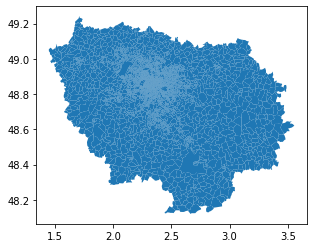

In [4]:
#Importer la couche des IRIS

IRIS= gpd.read_file("IRIS.geojson", encoding='utf-8')
IRIS.plot()
IRIS.head()

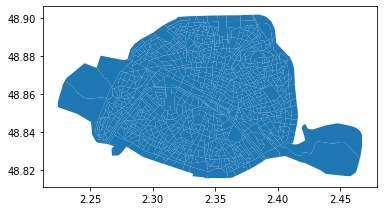

In [5]:
#Garder les IRIS de Paris

IRISPARIS = IRIS[(IRIS["dep"] == 75)]
IRISPARIS.plot()

,ebike,capacity,name,nom_arrondissement_communes,numbikesavailable,mechanical,stationcode,is_installed,is_renting,numdocksavailable,duedate,is_returning,geometry
0,5,35,Benjamin Godard - Victor Hugo,Paris,8,3,16107,OUI,OUI,26,2021-03-04T12:34:56+00:00,OUI,POINT (2.27572 48.86598)
1,1,20,Charonne - Robert et Sonia Delauney,Paris,2,1,11104,OUI,OUI,18,2021-03-04T12:44:23+00:00,OUI,POINT (2.39257 48.85591)
2,1,55,André Mazet - Saint-André des Arts,Paris,16,15,6015,OUI,OUI,39,2021-03-04T12:42:12+00:00,OUI,POINT (2.33910 48.85376)


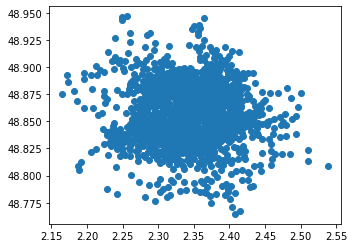

In [7]:
#Importer la couche des velibs

Velibs= gpd.read_file("velibs.geojson", encoding='utf-8')
Velibs.plot()
Velibs.head(3)

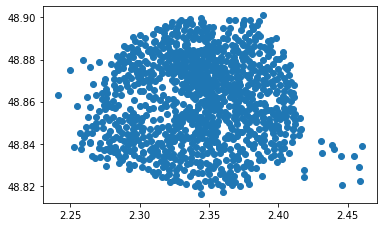

In [9]:
#Ne garder que les stations de Velibs de la ville de Paris (sélection par localisation)

VelibParis = gpd.overlay(Velibs, IRISPARIS, how='intersection')
VelibParis.plot()

,bois,typologie_simple,arrdt,sens_velo,statut,date_de_livraison,voie,longueur_du_troncon_en_km,bidirectionnel,length,piste,couloir_bus,reseau,position,type_continuite,circulation,geometry
0,Non,Pistes cyclables,13.0,Sens de circulation générale,Voie 50,2005-12-31,AVENUE D ITALIE,0.024642,Non,24.642247,Niveau chaussée,None,None,None,None,None,"LINESTRING (2.35604 48.83053, 2.35611 48.83031)"
1,Non,Couloirs de bus ouverts aux vélos,10.0,Sens de circulation générale,Voie 50,None,BOULEVARD DE BONNE NOUVELLE,0.088494,Non,88.493805,None,Marqué,None,None,None,None,"LINESTRING (2.35096 48.87011, 2.34981 48.87036)"
2,Non,Couloirs de bus ouverts aux vélos,13.0,Sens de circulation générale,Voie 50,None,AVENUE DE LA PORTE D ITALIE,0.051211,Non,51.211336,None,Protégé,None,None,None,None,"LINESTRING (2.35993 48.81727, 2.36007 48.81682)"


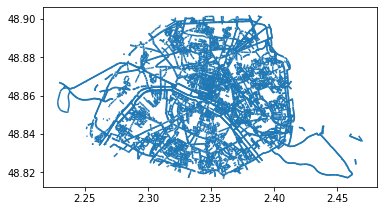

In [10]:
#Importer la couche des pistes cyclables

pistescyclables= gpd.read_file("pistescyclables.geojson", encoding='utf-8')
pistescyclables.plot()
pistescyclables.head(3)

,geometry,iris,nom_iris,typ_iris,dep,insee_com,code_iris
nom_com,,,,,,,
Paris 10e Arrondissement,"POLYGON ((2.37022 48.88240, 2.37024 48.88151, ...",3805,Porte Saint-Denis 5,H,75,75110,751103805
Paris 11e Arrondissement,"POLYGON ((2.36664 48.86312, 2.36616 48.86396, ...",4201,Saint-Ambroise 1,H,75,75111,751114201
Paris 12e Arrondissement,"POLYGON ((2.36897 48.84252, 2.36810 48.84321, ...",4508,Bel Air 8,H,75,75112,751124508
Paris 13e Arrondissement,"POLYGON ((2.34155 48.82839, 2.34149 48.82857, ...",5206,Croulebarbe 6,H,75,75113,751135206
Paris 14e Arrondissement,"POLYGON ((2.30187 48.82500, 2.30132 48.82513, ...",5307,Montparnasse 7,H,75,75114,751145307


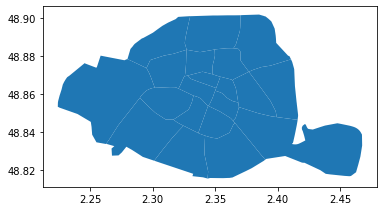

In [59]:
# Créer une couche des arrondissements

ARDT = IRISPARIS.dissolve(by='nom_com')
ARDT.plot()
ARDT.head()

## Calcul de surface, de longueur

In [ ]:
#Calculer la surface des IRIS avec une reprojection en amont

IRIS = IRISPARIS.to_crs(2154)
IRIS["surface"] = IRIS['geometry'].area/1000000
IRIS.head(5)

,iris,nom_iris,typ_iris,dep,insee_com,nom_com,code_iris,geometry,surface
0,1203,Sainte-Avoye 3,H,75,75103,Paris 3e Arrondissement,751031203,"POLYGON ((652375.500 6862786.000, 652383.300 6...",0.043852
1,1102,Les Archives 2,H,75,75103,Paris 3e Arrondissement,751031102,"POLYGON ((653621.380 6862212.150, 653637.290 6...",0.065652
2,1601,Notre Dame 1,H,75,75104,Paris 4e Arrondissement,751041601,"POLYGON ((652928.990 6861322.000, 652857.900 6...",0.091055
3,1702,Saint-Victor 2,H,75,75105,Paris 5e Arrondissement,751051702,"POLYGON ((652420.000 6860923.400, 652502.600 6...",0.048930
4,2102,Monnaie 2,H,75,75106,Paris 6e Arrondissement,751062102,"POLYGON ((651350.400 6861741.500, 651346.000 6...",0.082562


In [ ]:
#Calculer la longueur des tronçons des pistes cyclables

pistescyclables = pistescyclables.to_crs(2154)
pistescyclables["longueur"] = pistescyclables['geometry'].length
pistescyclables.head(3)

,bois,typologie_simple,arrdt,sens_velo,statut,voie,longueur_du_troncon_en_km,bidirectionnel,length,piste,position,date_de_livraison,couloir_bus,reseau,type_continuite,circulation,geometry,longueur
0,Non,Bandes cyclables,9.0,Contresens,Zone 30,RUE DE PROVENCE,0.175731,Non,175.730790,None,None,None,None,None,None,None,"LINESTRING (651237.609 6864009.456, 651062.121...",175.730790
1,Non,Pistes cyclables,13.0,None,Voie 50,BOULEVARD VINCENT AURIOL,0.005123,Oui,5.123270,Niveau trottoir,Axial,None,None,None,None,None,"LINESTRING (652760.479 6859176.047, 652762.699...",5.123270
2,Non,Bandes cyclables,13.0,Sens de circulation générale,Voie 50,AVENUE D ITALIE,0.044163,Non,44.162896,None,None,2005-12-31,None,None,None,None,"LINESTRING (652885.503 6858330.855, 652894.076...",44.162896


## Transformations géométriques

,iris,nom_iris,typ_iris,dep,insee_com,nom_com,code_iris,geometry,surface
0,1203,Sainte-Avoye 3,H,75,75103,Paris 3e Arrondissement,751031203,POINT (652470.831 6862667.679),0.043852
1,1102,Les Archives 2,H,75,75103,Paris 3e Arrondissement,751031102,POINT (653516.646 6862084.841),0.065652
2,1601,Notre Dame 1,H,75,75104,Paris 4e Arrondissement,751041601,POINT (652789.907 6861492.890),0.091055
3,1702,Saint-Victor 2,H,75,75105,Paris 5e Arrondissement,751051702,POINT (652550.522 6860731.161),0.048930
4,2102,Monnaie 2,H,75,75106,Paris 6e Arrondissement,751062102,POINT (651433.961 6861949.340),0.082562


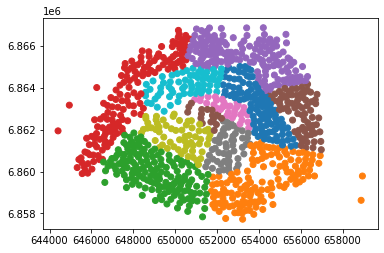

In [ ]:
# Créer une couche de centroides des IRIS

IRIScentro = IRIS.copy()
IRIScentro.geometry = IRIScentro['geometry'].centroid
IRIScentro.plot(column = "nom_com")
IRIScentro.head()

In [ ]:
# Créer une paire de coordonées géographique en WGS84 pour la couche des IRIS (en 2154)

IRIScentro["Longitude"] = IRIScentro['geometry'].to_crs(4326).x
IRIScentro["Latitude"] = IRIScentro['geometry'].to_crs(4326).y
IRIScentro.head()

,iris,nom_iris,typ_iris,dep,insee_com,nom_com,code_iris,geometry,surface,Longitude,Latitude
0,1203,Sainte-Avoye 3,H,75,75103,Paris 3e Arrondissement,751031203,POINT (652470.831 6862667.679),0.043852,2.352154,48.862287
1,1102,Les Archives 2,H,75,75103,Paris 3e Arrondissement,751031102,POINT (653516.646 6862084.841),0.065652,2.366472,48.857122
2,1601,Notre Dame 1,H,75,75104,Paris 4e Arrondissement,751041601,POINT (652789.907 6861492.890),0.091055,2.356633,48.851746
3,1702,Saint-Victor 2,H,75,75105,Paris 5e Arrondissement,751051702,POINT (652550.522 6860731.161),0.048930,2.353456,48.844878
4,2102,Monnaie 2,H,75,75106,Paris 6e Arrondissement,751062102,POINT (651433.961 6861949.340),0.082562,2.338104,48.855750


## Jointure spatiale et agrégation statistique

In [ ]:
# Jointure spatiale Velibs <> IRIS

Velibok = gpd.sjoin(VelibParis, IRISPARIS)
Velibok.head()

,ebike,capacity,name,nom_arrondissement_communes,numbikesavailable,mechanical,stationcode,is_installed,is_renting,numdocksavailable,duedate,is_returning,iris_left,nom_iris_left,typ_iris_left,dep_left,insee_com_left,nom_com_left,code_iris_left,geometry,index_right,iris_right,nom_iris_right,typ_iris_right,dep_right,insee_com_right,nom_com_right,code_iris_right
0,2,55,André Mazet - Saint-André des Arts,Paris,23,21,6015,OUI,OUI,32,2021-03-04T09:42:08+00:00,OUI,2103,Monnaie 3,H,75,75106,Paris 6e Arrondissement,751062103,POINT (2.33910 48.85376),2057,2103,Monnaie 3,H,75,75106,Paris 6e Arrondissement,751062103
1,3,23,Pont de Lodi - Dauphine,Paris,14,11,6014,OUI,OUI,8,2021-03-04T09:42:00+00:00,OUI,2103,Monnaie 3,H,75,75106,Paris 6e Arrondissement,751062103,POINT (2.33995 48.85530),2057,2103,Monnaie 3,H,75,75106,Paris 6e Arrondissement,751062103
2,1,35,Benjamin Godard - Victor Hugo,Paris,2,1,16107,OUI,OUI,32,2021-03-04T09:39:59+00:00,OUI,6304,Porte Dauphine 4,H,75,75116,Paris 16e Arrondissement,751166304,POINT (2.27572 48.86598),2787,6304,Porte Dauphine 4,H,75,75116,Paris 16e Arrondissement,751166304
3,3,18,Flandrin - Henri Martin,Paris,6,3,16018,OUI,OUI,12,2021-03-04T09:41:16+00:00,OUI,6304,Porte Dauphine 4,H,75,75116,Paris 16e Arrondissement,751166304,POINT (2.27242 48.86433),2787,6304,Porte Dauphine 4,H,75,75116,Paris 16e Arrondissement,751166304
4,1,20,Charonne - Robert et Sonia Delauney,Paris,1,0,11104,OUI,OUI,19,2021-03-04T09:39:56+00:00,OUI,4411,Sainte-Marguerite 11,H,75,75111,Paris 11e Arrondissement,751114411,POINT (2.39257 48.85591),2128,4411,Sainte-Marguerite 11,H,75,75111,Paris 11e Arrondissement,751114411


In [ ]:
#Réorganiser la table 

Velibok = Velibok[["stationcode", "name", "capacity", "numbikesavailable", "numdocksavailable", "nom_com_left", "nom_iris_left", "geometry"]]
Velibok.head()

,stationcode,name,capacity,numbikesavailable,numdocksavailable,nom_com_left,nom_iris_left,geometry
0,6015,André Mazet - Saint-André des Arts,55,23,32,Paris 6e Arrondissement,Monnaie 3,POINT (2.33910 48.85376)
1,6014,Pont de Lodi - Dauphine,23,14,8,Paris 6e Arrondissement,Monnaie 3,POINT (2.33995 48.85530)
2,16107,Benjamin Godard - Victor Hugo,35,2,32,Paris 16e Arrondissement,Porte Dauphine 4,POINT (2.27572 48.86598)
3,16018,Flandrin - Henri Martin,18,6,12,Paris 16e Arrondissement,Porte Dauphine 4,POINT (2.27242 48.86433)
4,11104,Charonne - Robert et Sonia Delauney,20,1,19,Paris 11e Arrondissement,Sainte-Marguerite 11,POINT (2.39257 48.85591)


In [ ]:
#Renommer les colonnes

Velibok = Velibok.rename(columns={'Code_Station': 'ID_Station', 'name':'Nom', 'capacity':'Capacite', 'numbikesavailable': 'nbVelos','numdocksavailable': 'Nbemplacements', 'nom_com_left': 'Arrondissement', 'nom_iris_left':'IRIS'})
Velibok.head()

,stationcode,Nom,Capacite,nbVelos,Nbemplacements,Arrondissement,IRIS,geometry
0,6015,André Mazet - Saint-André des Arts,55,23,32,Paris 6e Arrondissement,Monnaie 3,POINT (2.33910 48.85376)
1,6014,Pont de Lodi - Dauphine,23,14,8,Paris 6e Arrondissement,Monnaie 3,POINT (2.33995 48.85530)
2,16107,Benjamin Godard - Victor Hugo,35,2,32,Paris 16e Arrondissement,Porte Dauphine 4,POINT (2.27572 48.86598)
3,16018,Flandrin - Henri Martin,18,6,12,Paris 16e Arrondissement,Porte Dauphine 4,POINT (2.27242 48.86433)
4,11104,Charonne - Robert et Sonia Delauney,20,1,19,Paris 11e Arrondissement,Sainte-Marguerite 11,POINT (2.39257 48.85591)


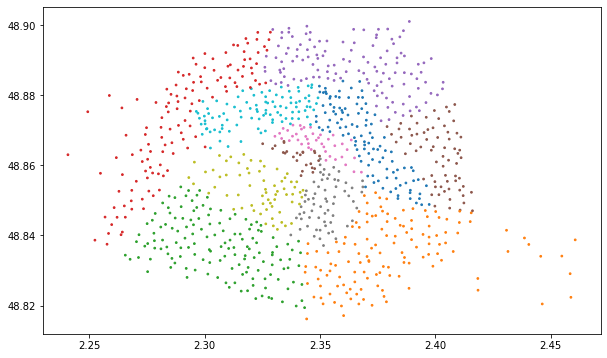

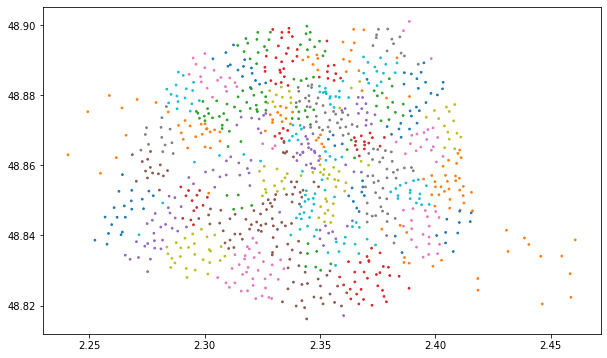

In [ ]:
#Faire deux cartes (stations catégorisées par Arrondissement et par IRIS) pour vérification

Velibok.plot(figsize=(10,10),column='Arrondissement', markersize= 3, legend=False)
Velibok.plot(figsize=(10,10),column='IRIS', markersize=3,  legend=False)


In [ ]:
# Compter le nombre de stations de vélibs par IRIS

Nbvelib  = Velibok[["IRIS", "stationcode"]].groupby("IRIS").size()
Nbvelib =pd.DataFrame(Nbvelib)
Nbvelib = Nbvelib.rename(columns={0: 'Nbstations'})
Nbvelib.head(5)

,Nbstations
IRIS,
Amerique 11,1
Amerique 13,1
Amerique 14,1
Amerique 18,1
Amerique 19,3


In [ ]:
#Verification somme

total1 = VelibParis['stationcode'].count()
total2 = Nbvelib['Nbstations'].sum()

print(total1)
print(total2)

998
998


In [ ]:
# Calculer la capacité des stations de vélibs par IRIS (résumé statistique)

Nbvelib  = Velibok[["IRIS", "Capacite"]].groupby("IRIS").sum()
Nbvelib =pd.DataFrame(Nbvelib)
Nbvelib = Nbvelib.rename(columns={0: 'NbVelibs'})
Nbvelib.head(5)

,Capacite
IRIS,
Amerique 11,28
Amerique 13,18
Amerique 14,17
Amerique 18,17
Amerique 19,94


In [ ]:
#Verification somme

total1 = VelibParis['capacity'].sum()
total2 = Nbvelib['Capacite'].sum()

print(total1)
print(total2)

32179
32179


In [ ]:
# Faire la jointure attributaire

IRISbis = IRISPARIS.merge(Nbvelib, left_on='nom_iris', right_on='IRIS')
IRISbis.head()

,iris,nom_iris,typ_iris,dep,insee_com,nom_com,code_iris,geometry,Capacite
0,1203,Sainte-Avoye 3,H,75,75103,Paris 3e Arrondissement,751031203,"POLYGON ((2.35084 48.86334, 2.35095 48.86340, ...",26
1,1102,Les Archives 2,H,75,75103,Paris 3e Arrondissement,751031102,"POLYGON ((2.36789 48.85827, 2.36811 48.85739, ...",51
2,1702,Saint-Victor 2,H,75,75105,Paris 5e Arrondissement,751051702,"POLYGON ((2.35166 48.84660, 2.35279 48.84595, ...",74
3,2102,Monnaie 2,H,75,75106,Paris 6e Arrondissement,751062102,"POLYGON ((2.33699 48.85387, 2.33692 48.85452, ...",28
4,3805,Porte Saint-Denis 5,H,75,75110,Paris 10e Arrondissement,751103805,"POLYGON ((2.35143 48.87711, 2.35123 48.87643, ...",11


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  This is separate from the ipykernel package so we can avoid doing imports until


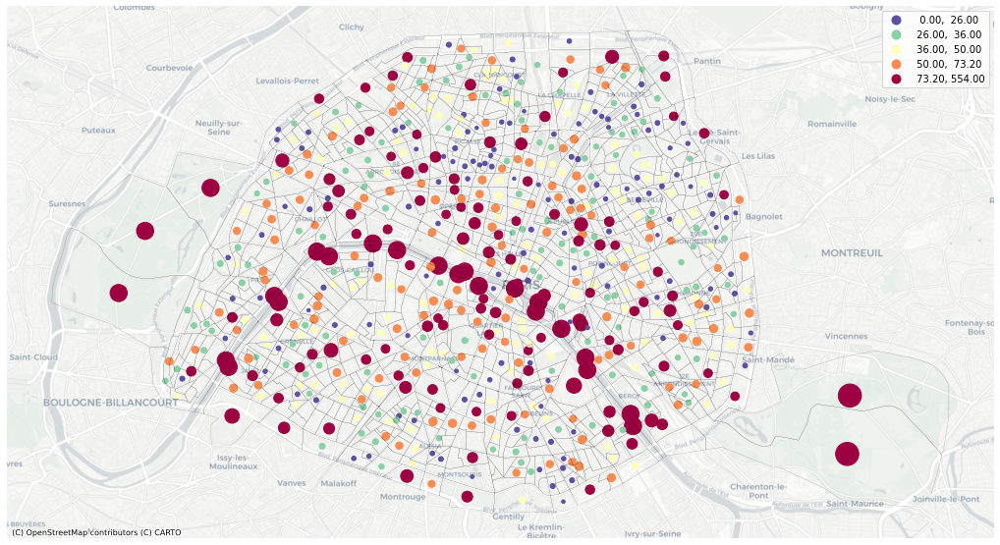

In [ ]:
#Cartographier la capacité des stations de vélibs par IRIS

IRISbis.geometry = IRISbis['geometry'].centroid

Carte1, ax = plt.subplots(figsize=(18,16))
IRISPARIS.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.1, color = 'black')
IRISbis.to_crs('EPSG:3857').plot(ax=ax, markersize="Capacite", column="Capacite", alpha=1, cmap='Spectral_r',scheme='quantiles', categorical=False, legend=True)
ctx.add_basemap(ax,  source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.show()

## Exercice autour des pistes cyclables

* Faire la jointure spatiale (pistes cyclables <> IRIS
* Calculer la somme des longueurs de pistes cyclable par IRIS
* Cartographier cet indicateur

In [ ]:
# Jointure spatiale Velibs <> IRIS

pistescyclablesok = gpd.sjoin(pistescyclables, IRIS)
pistescyclablesok.head()

,bois,typologie_simple,arrdt,sens_velo,statut,voie,longueur_du_troncon_en_km,bidirectionnel,length,piste,position,date_de_livraison,couloir_bus,reseau,type_continuite,circulation,geometry,longueur,index_right,iris,nom_iris,typ_iris,dep,insee_com,nom_com,code_iris,surface
0,Non,Bandes cyclables,9.0,Contresens,Zone 30,RUE DE PROVENCE,0.175731,Non,175.730790,None,None,None,None,None,None,None,"LINESTRING (651237.609 6864009.456, 651062.121...",175.730790,3109,3408,Chaussee d'Antin 8,A,75,75109,Paris 9e Arrondissement,751093408,0.082151
154,Non,Couloirs de bus ouverts aux vélos,9.0,Sens de circulation générale,Zone 30,Rue de la Chaussée d'Antin,0.013982,Non,13.982415,Niveau chaussée,None,2009-12-31,None,None,Traversée de carrefour,None,"LINESTRING (651020.745 6864130.857, 651024.497...",13.982415,3109,3408,Chaussee d'Antin 8,A,75,75109,Paris 9e Arrondissement,751093408,0.082151
155,Non,Couloirs de bus ouverts aux vélos,9.0,Sens de circulation générale,Zone 30,Rue de la Chaussée d'Antin,0.058769,Non,58.768555,None,None,2009-12-31,Marqué,None,None,None,"LINESTRING (651024.497 6864117.388, 651040.269...",58.768555,3109,3408,Chaussee d'Antin 8,A,75,75109,Paris 9e Arrondissement,751093408,0.082151
768,Non,Couloirs de bus ouverts aux vélos,9.0,Sens de circulation générale,Zone 30,Rue de la Chaussée d'Antin,0.094016,Non,94.016292,None,None,2009-12-31,Marqué,None,None,None,"LINESTRING (650995.514 6864221.425, 651020.745...",94.016292,3109,3408,Chaussee d'Antin 8,A,75,75109,Paris 9e Arrondissement,751093408,0.082151
1478,Non,Bandes cyclables,9.0,Contresens,Zone de rencontre,RUE DE PROVENCE,0.015522,Non,15.521966,None,None,2019-12-31,None,None,Traversée de carrefour,None,"LINESTRING (651047.169 6864015.369, 651048.786...",15.500707,3109,3408,Chaussee d'Antin 8,A,75,75109,Paris 9e Arrondissement,751093408,0.082151


In [ ]:
#Calculer la longueur des pistes cyclables par IRIS et en faire une carte

Longueurpistescyclables  = pistescyclablesok[["nom_iris", "longueur"]].groupby("nom_iris").sum()
Longueurpistescyclables =pd.DataFrame(Longueurpistescyclables)
Longueurpistescyclables.head(5)

,longueur
nom_iris,
Amerique 1,2003.132358
Amerique 10,1162.361189
Amerique 11,1295.051080
Amerique 12,829.970593
Amerique 13,958.983086


In [ ]:
#Verification somme

total1 = pistescyclablesok['longueur'].sum()
total2 = Longueurpistescyclables['longueur'].sum()

print(total1)
print(total2)

1671662.7310180047
1671662.731018005


In [ ]:
# Faire la jointure attributaire

IRISfinal = IRISPARIS.merge(Longueurpistescyclables, left_on='nom_iris', right_on='nom_iris')
IRISfinal.head()

,iris,nom_iris,typ_iris,dep,insee_com,nom_com,code_iris,geometry,longueur
0,1203,Sainte-Avoye 3,H,75,75103,Paris 3e Arrondissement,751031203,"POLYGON ((2.35084 48.86334, 2.35095 48.86340, ...",5445.670909
1,1102,Les Archives 2,H,75,75103,Paris 3e Arrondissement,751031102,"POLYGON ((2.36789 48.85827, 2.36811 48.85739, ...",405.046514
2,1601,Notre Dame 1,H,75,75104,Paris 4e Arrondissement,751041601,"POLYGON ((2.35855 48.85022, 2.35757 48.85056, ...",2771.445339
3,1702,Saint-Victor 2,H,75,75105,Paris 5e Arrondissement,751051702,"POLYGON ((2.35166 48.84660, 2.35279 48.84595, ...",275.943463
4,2102,Monnaie 2,H,75,75106,Paris 6e Arrondissement,751062102,"POLYGON ((2.33699 48.85387, 2.33692 48.85452, ...",890.350957


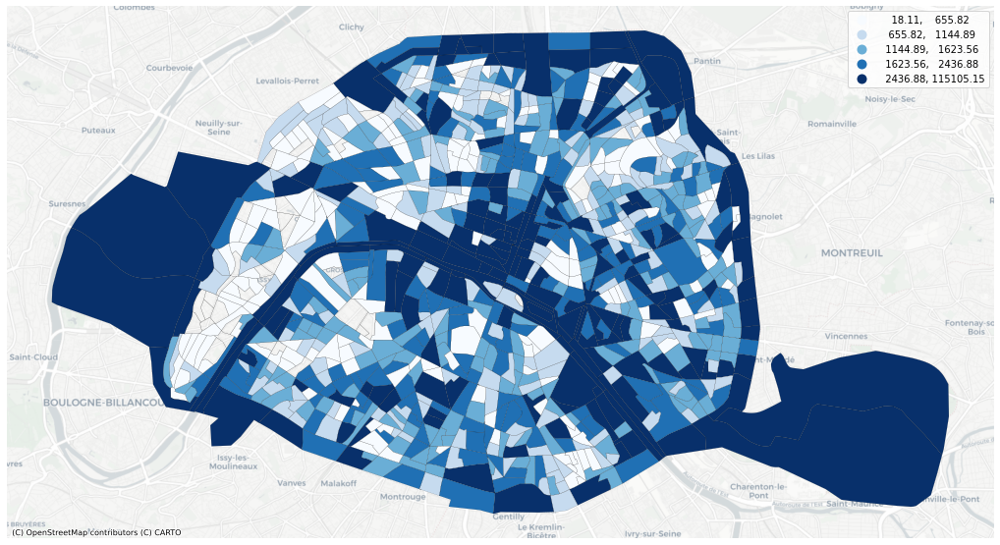

In [ ]:
#Cartographier la capacité des stations de vélibs par IRIS

Carte2, ax = plt.subplots(figsize=(18,16))
IRISPARIS.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.1, color = 'black')
IRISfinal.to_crs('EPSG:3857').plot(ax=ax, column="longueur", alpha=1, cmap='Blues',scheme='quantiles', categorical=False, legend=True)
ctx.add_basemap(ax,  source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.show()

## Exporter des couches dans différents formats


In [ ]:
# Exporter des couches

## En shapefile

IRISbis.to_file("IRISbis.shp")

## En GEOJSON

IRISbis.to_file("IRISbis.geojson", driver='GeoJSON')

## En Geopackage (pour combiner plusieurs couches)

IRISbis.to_file("Paris.gpkg", layer='countries', driver="GPKG")
Velibok.to_file("Paris.gpkg", layer='cities', driver="GPKG")

## EXERCICE AUTOUR DES ARBRES

* Ne garder que les arbres de Paris
* Compter le nombre d'arbres par IRIS (jointure spatiale puis agrégations statistique)
* Verifier les sommes
* Calculer la hauteur moyenne des arbres par IRIS
* Faire la jointure attibutaire vers la couches des IRIS
* Faire une carte du nombre d'arbres par IRIS
* Faire une carte avec les hauteurs moyennes des arbres par IRIS

In [12]:
#Importer CSV to dataframe

arbres = pd.read_csv("arbres.csv", sep=';')
arbres.head()

,idbase,typeemplacement,domanialite,arrondissement,complementadresse,numero,adresse,idemplacement,libellefrancais,genre,espece,varieteoucultivar,circonferenceencm,hauteurenm,stadedeveloppement,remarquable,geo_point_2d
0,2029277,Arbre,DJS,PARIS 19E ARRDT,NaN,NaN,CENTRE SPORTIF JULES LADOUMEGUE / 35 ROUTE DES...,000104004,Copalme,Liquidambar,styraciflua,NaN,20,5,J,NON,"48.8910678703,2.39818911237"
1,251547,Arbre,Alignement,PARIS 16E ARRDT,NaN,NaN,AVENUE DU PRESIDENT WILSON,000303003,Platane,Platanus,x hispanica,NaN,205,20,A,NON,"48.8649086201,2.2993502247"
2,282670,Arbre,Alignement,PARIS 8E ARRDT,NaN,NaN,AVENUE PERCIER,000202005,Platane,Platanus,x hispanica,NaN,86,12,A,NON,"48.8740816418,2.31454494358"
3,185672,Arbre,DASCO,PARIS 20E ARRDT,NaN,NaN,ECOLE ELEMENTAIRE / 24 RUE OLIVIER METRA,098501015,Bouleau,Betula,pendula,NaN,75,12,J,NON,"48.8732579515,2.3942408403"
4,219422,Arbre,Alignement,PARIS 8E ARRDT,NaN,NaN,BOULEVARD HAUSSMANN,003202007,Platane,Platanus,x hispanica,NaN,54,9,A,NON,"48.8751388795,2.31742365137"


In [13]:
#Réorganiser la table

arbresok = arbres[["idbase", "domanialite", "arrondissement", "libellefrancais", "hauteurenm", "geo_point_2d"]]
arbresok.head()

,idbase,domanialite,arrondissement,libellefrancais,hauteurenm,geo_point_2d
0,2029277,DJS,PARIS 19E ARRDT,Copalme,5,"48.8910678703,2.39818911237"
1,251547,Alignement,PARIS 16E ARRDT,Platane,20,"48.8649086201,2.2993502247"
2,282670,Alignement,PARIS 8E ARRDT,Platane,12,"48.8740816418,2.31454494358"
3,185672,DASCO,PARIS 20E ARRDT,Bouleau,12,"48.8732579515,2.3942408403"
4,219422,Alignement,PARIS 8E ARRDT,Platane,9,"48.8751388795,2.31742365137"


In [14]:
#Séparer la colonne des coordonnées géographiques

arbresok[['Latitude','Longitude']] = arbresok['geo_point_2d'].str.split(',', expand=True)
arbresok.head()

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:3069: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


,idbase,domanialite,arrondissement,libellefrancais,hauteurenm,geo_point_2d,Latitude,Longitude
0,2029277,DJS,PARIS 19E ARRDT,Copalme,5,"48.8910678703,2.39818911237",48.8910678703,2.39818911237
1,251547,Alignement,PARIS 16E ARRDT,Platane,20,"48.8649086201,2.2993502247",48.8649086201,2.2993502247
2,282670,Alignement,PARIS 8E ARRDT,Platane,12,"48.8740816418,2.31454494358",48.8740816418,2.31454494358
3,185672,DASCO,PARIS 20E ARRDT,Bouleau,12,"48.8732579515,2.3942408403",48.8732579515,2.3942408403
4,219422,Alignement,PARIS 8E ARRDT,Platane,9,"48.8751388795,2.31742365137",48.8751388795,2.31742365137


In [15]:
#Dataframe to GeoDataframe

arbresok = gpd.GeoDataFrame(arbresok, crs = 'epsg:4326', geometry=gpd.points_from_xy(arbresok.Longitude, arbresok.Latitude))

In [ ]:
#Créer un index spatial (environ 60 secondes sans index spatial)

IRISPARIS.sindex
arbresok.sindex

In [16]:
#Ne garder que les arbres de la ville de Paris

ArbresParis = gpd.overlay(arbresok, IRISPARIS, how='intersection')
ArbresParis.head()

,idbase,domanialite,arrondissement,libellefrancais,hauteurenm,geo_point_2d,Latitude,Longitude,iris,nom_iris,typ_iris,dep,insee_com,nom_com,code_iris,geometry
0,2029277,DJS,PARIS 19E ARRDT,Copalme,5,"48.8910678703,2.39818911237",48.8910678703,2.39818911237,7401,Pont de Flandre 1,H,75,75119,Paris 19e Arrondissement,751197401,POINT (2.39819 48.89107)
1,195778,PERIPHERIQUE,PARIS 19E ARRDT,Pin,8,"48.9001235785,2.38322501988",48.9001235785,2.38322501988,7401,Pont de Flandre 1,H,75,75119,Paris 19e Arrondissement,751197401,POINT (2.38323 48.90012)
2,244721,Alignement,PARIS 19E ARRDT,Sophora,10,"48.8935066484,2.39475564106",48.8935066484,2.39475564106,7401,Pont de Flandre 1,H,75,75119,Paris 19e Arrondissement,751197401,POINT (2.39476 48.89351)
3,195777,PERIPHERIQUE,PARIS 19E ARRDT,Pin,5,"48.9001335481,2.3832976338",48.9001335481,2.3832976338,7401,Pont de Flandre 1,H,75,75119,Paris 19e Arrondissement,751197401,POINT (2.38330 48.90013)
4,114747,Jardin,PARIS 19E ARRDT,Pin,5,"48.8997005285,2.39157031289",48.8997005285,2.39157031289,7401,Pont de Flandre 1,H,75,75119,Paris 19e Arrondissement,751197401,POINT (2.39157 48.89970)


In [17]:
# Jointure spatiale Arbres <> IRIS

arbresok = gpd.sjoin(ArbresParis, IRISPARIS)
arbresok.head()

,idbase,domanialite,arrondissement,libellefrancais,hauteurenm,geo_point_2d,Latitude,Longitude,iris_left,nom_iris_left,typ_iris_left,dep_left,insee_com_left,nom_com_left,code_iris_left,geometry,index_right,iris_right,nom_iris_right,typ_iris_right,dep_right,insee_com_right,nom_com_right,code_iris_right
0,2029277,DJS,PARIS 19E ARRDT,Copalme,5,"48.8910678703,2.39818911237",48.8910678703,2.39818911237,7401,Pont de Flandre 1,H,75,75119,Paris 19e Arrondissement,751197401,POINT (2.39819 48.89107),4964,7401,Pont de Flandre 1,H,75,75119,Paris 19e Arrondissement,751197401
1,195778,PERIPHERIQUE,PARIS 19E ARRDT,Pin,8,"48.9001235785,2.38322501988",48.9001235785,2.38322501988,7401,Pont de Flandre 1,H,75,75119,Paris 19e Arrondissement,751197401,POINT (2.38323 48.90012),4964,7401,Pont de Flandre 1,H,75,75119,Paris 19e Arrondissement,751197401
2,244721,Alignement,PARIS 19E ARRDT,Sophora,10,"48.8935066484,2.39475564106",48.8935066484,2.39475564106,7401,Pont de Flandre 1,H,75,75119,Paris 19e Arrondissement,751197401,POINT (2.39476 48.89351),4964,7401,Pont de Flandre 1,H,75,75119,Paris 19e Arrondissement,751197401
3,195777,PERIPHERIQUE,PARIS 19E ARRDT,Pin,5,"48.9001335481,2.3832976338",48.9001335481,2.3832976338,7401,Pont de Flandre 1,H,75,75119,Paris 19e Arrondissement,751197401,POINT (2.38330 48.90013),4964,7401,Pont de Flandre 1,H,75,75119,Paris 19e Arrondissement,751197401
4,114747,Jardin,PARIS 19E ARRDT,Pin,5,"48.8997005285,2.39157031289",48.8997005285,2.39157031289,7401,Pont de Flandre 1,H,75,75119,Paris 19e Arrondissement,751197401,POINT (2.39157 48.89970),4964,7401,Pont de Flandre 1,H,75,75119,Paris 19e Arrondissement,751197401


In [18]:
# Compter le nombre d'arbres par IRIS

NbArbres  = arbresok[["code_iris_left", "idbase"]].groupby("code_iris_left").size()
NbArbres =pd.DataFrame(NbArbres)
NbArbres = NbArbres.rename(columns={0: 'NbArbres'})
NbArbres.head(5)

,NbArbres
code_iris_left,
751010101,123
751010102,76
751010103,45
751010199,458
751010201,159


In [19]:
#Verification somme

total1 = ArbresParis['domanialite'].size
total2 = NbArbres['NbArbres'].sum()

print(total1)
print(total2)

178735
178735


In [20]:
# Faire la jointure attributaire

IRISbis = IRISPARIS.merge(NbArbres, left_on='code_iris', right_on='code_iris_left')
IRISbis.head()

,iris,nom_iris,typ_iris,dep,insee_com,nom_com,code_iris,geometry,NbArbres
0,1203,Sainte-Avoye 3,H,75,75103,Paris 3e Arrondissement,751031203,"POLYGON ((2.35084 48.86334, 2.35095 48.86340, ...",60
1,1102,Les Archives 2,H,75,75103,Paris 3e Arrondissement,751031102,"POLYGON ((2.36789 48.85827, 2.36811 48.85739, ...",66
2,1601,Notre Dame 1,H,75,75104,Paris 4e Arrondissement,751041601,"POLYGON ((2.35855 48.85022, 2.35757 48.85056, ...",30
3,1702,Saint-Victor 2,H,75,75105,Paris 5e Arrondissement,751051702,"POLYGON ((2.35166 48.84660, 2.35279 48.84595, ...",157
4,2102,Monnaie 2,H,75,75106,Paris 6e Arrondissement,751062102,"POLYGON ((2.33699 48.85387, 2.33692 48.85452, ...",17


In [21]:
# Calculer la hauteur moyenne des arbres par IRIS

Hauteurmoyenne = arbresok[["code_iris_left", "hauteurenm"]].groupby("code_iris_left").mean()
Hauteurmoyenne.head()

,hauteurenm
code_iris_left,
751010101,10.691057
751010102,9.250000
751010103,6.977778
751010199,10.777293
751010201,6.591195


In [22]:
# Faire la jointure attributaire

IRISfinal = IRISbis.merge(Hauteurmoyenne, left_on='code_iris', right_on='code_iris_left')
IRISfinal.head()

,iris,nom_iris,typ_iris,dep,insee_com,nom_com,code_iris,geometry,NbArbres,hauteurenm
0,1203,Sainte-Avoye 3,H,75,75103,Paris 3e Arrondissement,751031203,"POLYGON ((2.35084 48.86334, 2.35095 48.86340, ...",60,9.683333
1,1102,Les Archives 2,H,75,75103,Paris 3e Arrondissement,751031102,"POLYGON ((2.36789 48.85827, 2.36811 48.85739, ...",66,11.257576
2,1601,Notre Dame 1,H,75,75104,Paris 4e Arrondissement,751041601,"POLYGON ((2.35855 48.85022, 2.35757 48.85056, ...",30,7.766667
3,1702,Saint-Victor 2,H,75,75105,Paris 5e Arrondissement,751051702,"POLYGON ((2.35166 48.84660, 2.35279 48.84595, ...",157,8.445860
4,2102,Monnaie 2,H,75,75106,Paris 6e Arrondissement,751062102,"POLYGON ((2.33699 48.85387, 2.33692 48.85452, ...",17,7.176471


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  This is separate from the ipykernel package so we can avoid doing imports until


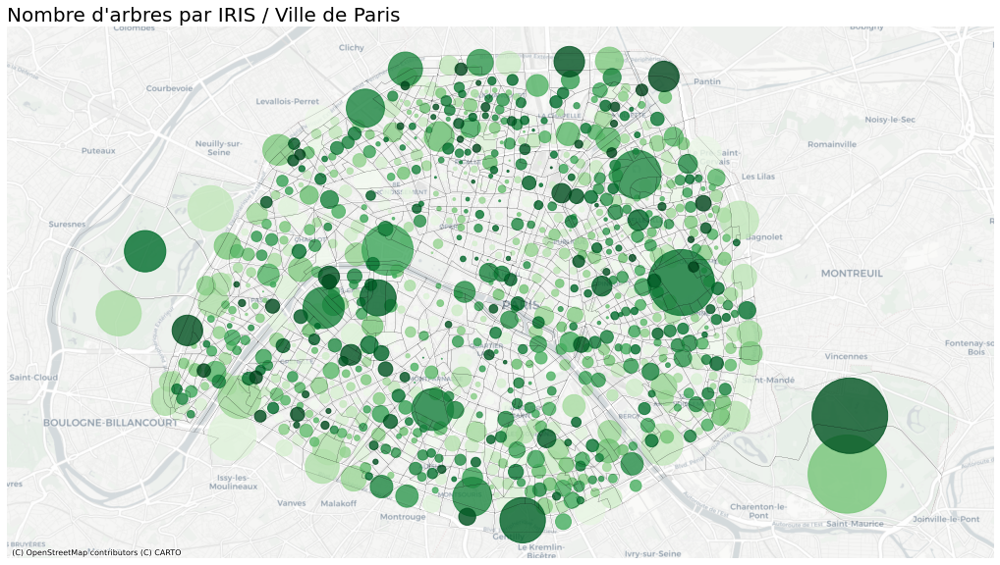

In [115]:
#Cartographier le nombre d'arbres par IRIS
IRISfinalcentro = IRISfinal.copy()
IRISfinalcentro.geometry = IRISfinalcentro['geometry'].centroid

map3, ax = plt.subplots(figsize=(18,16))
IRISPARIS.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.1, color = 'black')
IRISfinalcentro.to_crs('EPSG:3857').plot(ax=ax, markersize="NbArbres", alpha=0.8, cmap='Greens',scheme='quantiles', categorical=False, legend=True)
ctx.add_basemap(ax,  source=ctx.providers.CartoDB.Positron)
plt.title("Nombre d'arbres par IRIS / Ville de Paris", loc='left', fontsize=20)
ax.axis("off")
plt.show()

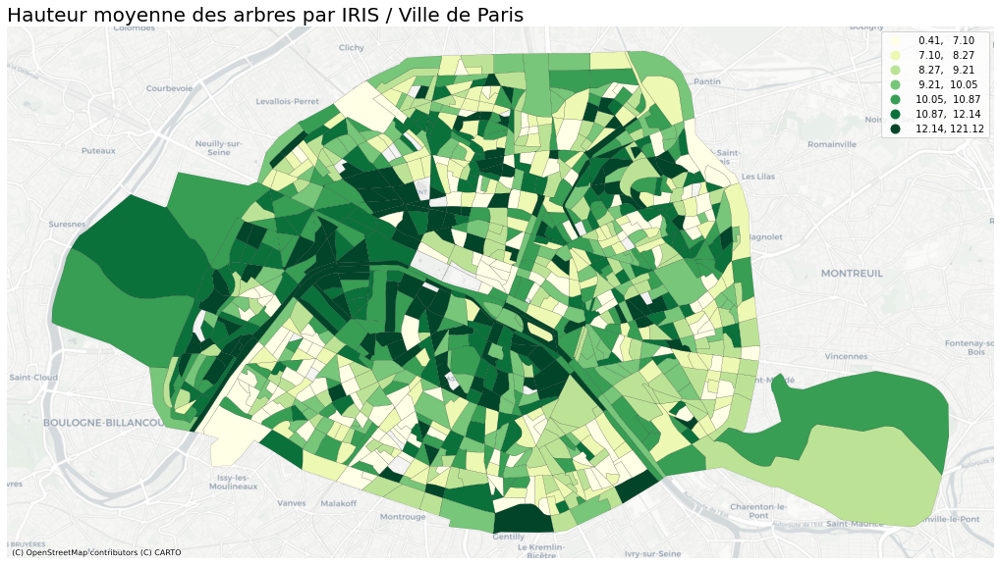

In [24]:
#Cartographier la hauteur moyenne des arbres par IRIS

map3, ax = plt.subplots(figsize=(18,16))
IRISPARIS.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.1, color = 'black')
IRISfinal.to_crs('EPSG:3857').plot(ax=ax, k=7, column="hauteurenm", alpha=1, cmap='YlGn',scheme='quantiles', categorical=False, legend=True)
ctx.add_basemap(ax,  source=ctx.providers.CartoDB.Positron)
plt.title("Hauteur moyenne des arbres par IRIS / Ville de Paris", loc='left', fontsize=20)
ax.axis("off")
plt.show()

## Buffer, Intersection, difference...




In [25]:
#Téléchargement des datas depuis le site opendata de Paris
!wget -O ArretsTC.geojson https://data.iledefrance-mobilites.fr/explore/dataset/emplacement-des-gares-idf/download/?format=geojson&timezone=Europe/Berlin&lang=fr 
!wget -O LignesTC.geojson https://data.iledefrance-mobilites.fr/explore/dataset/traces-du-reseau-ferre-idf/download/?format=geojson&timezone=Europe/Berlin&lang=fr

--2021-03-04 12:58:08--  https://data.iledefrance-mobilites.fr/explore/dataset/emplacement-des-gares-idf/download/?format=geojson
Resolving data.iledefrance-mobilites.fr (data.iledefrance-mobilites.fr)... 34.249.199.226, 34.248.20.69
Connecting to data.iledefrance-mobilites.fr (data.iledefrance-mobilites.fr)|34.249.199.226|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/json]
Saving to: ‘ArretsTC.geojson’

ArretsTC.geojson        [   <=>              ]   1.12M  1.74MB/s    in 0.6s    

2021-03-04 12:58:10 (1.74 MB/s) - ‘ArretsTC.geojson’ saved [1176893]

--2021-03-04 12:58:10--  https://data.iledefrance-mobilites.fr/explore/dataset/traces-du-reseau-ferre-idf/download/?format=geojson
Resolving data.iledefrance-mobilites.fr (data.iledefrance-mobilites.fr)... 34.249.199.226, 34.248.20.69
Connecting to data.iledefrance-mobilites.fr (data.iledefrance-mobilites.fr)|34.249.199.226|:443... connected.
HTTP request sent, awaiting response... 200

,tertrain,cod_ligf,nom_iv,res_stif,cod_resf,tertram,id_ref_zdl,navette,gares_id,principal,reseau,val,res_com,rer,ternavette,picto,ligne_code,fer,terrer,num_psr,nom_gare,termetro,y,ligne,num_mod,idf,terfer,train,tramway,exploitant,metro,terval,indice_lig,id_ref_lda,mode,nomlong,idrefligc,x,idrefliga,geometry
0,0,7.0,Charles de Gaulle Etoile,110.0,3.0,0,58759.0,0,153,0,METRO,0,METRO 2,0,0,"{'mimetype': 'image/svg+xml', 'format': 'svg',...",2-337,0,0,0,Charles de Gaulle-Étoile,0,6.864074e+06,2,2047,1,0,0,0,RATP,1,0,2,71347,Metro,CHARLES DE GAULLE ETOILE,C01372,648331.6965,A01535,POINT (2.29557 48.87461)
1,0,8.0,Havre-Caumartin,110.0,3.0,0,58718.0,0,344,0,METRO,0,METRO 3,0,0,"{'mimetype': 'image/svg+xml', 'format': 'svg',...",3-103061,0,0,0,Havre-Caumartin,0,6.863931e+06,3,2060,1,0,0,0,RATP,1,0,3,73688,Metro,HAVRE-CAUMARTIN,C01373,650675.9316,A01536,POINT (2.32754 48.87351)
2,0,11.0,Gare d'Austerlitz,110.0,3.0,0,43072.0,0,312,1,METRO,0,METRO 5,0,0,"{'mimetype': 'image/svg+xml', 'format': 'svg',...",5-375,0,0,0,Gare d'Austerlitz,0,6.860434e+06,5,2104,1,0,0,0,RATP,1,0,5,71135,Metro,AUSTERLITZ,C01375,653420.2120,A01538,POINT (2.36534 48.84227)
3,0,13.0,Gare de l'Est,110.0,3.0,0,43138.0,0,315,1,METRO,0,METRO 7,0,0,"{'mimetype': 'image/svg+xml', 'format': 'svg',...",7-327,0,0,0,Gare de l'Est,0,6.864219e+06,7,2178,1,0,0,0,RATP,1,0,7,71359,Metro,GARE DE L'EST,C01377,652916.6085,A01540,POINT (2.35806 48.87627)
4,0,5.0,Montparnasse Bienvenüe,110.0,3.0,0,43238.0,0,563,1,METRO,0,METRO 13,0,0,"{'mimetype': 'image/svg+xml', 'format': 'svg',...",13-285,0,0,0,Montparnasse-Bienvenüe,0,6.860468e+06,13,2334,1,0,0,0,RATP,1,0,13,71139,Metro,MONTPARNASSE,C01383,650165.0831,A01546,POINT (2.32098 48.84233)


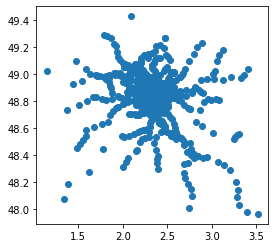

In [26]:
#Importer la couche des arrêts de TC

ArretsTC= gpd.read_file("ArretsTC.geojson", encoding='utf-8')
ArretsTC.plot()
ArretsTC.head()

,tertrain,cod_ligf,nom_iv,res_stif,cod_resf,tertram,id_ref_zdl,navette,gares_id,principal,reseau,val,res_com,rer,ternavette,picto,ligne_code,fer,terrer,num_psr,nom_gare,termetro,y,ligne,num_mod,idf,terfer,train,tramway,exploitant,metro,terval,indice_lig,id_ref_lda,mode,nomlong,idrefligc,x,idrefliga,iris,nom_iris,typ_iris,dep,insee_com,nom_com,code_iris,geometry
0,0,7.0,Charles de Gaulle Etoile,110.0,3.0,0,58759.0,0,153,0,METRO,0,METRO 2,0,0,"{'mimetype': 'image/svg+xml', 'format': 'svg',...",2-337,0,0,0,Charles de Gaulle-Étoile,0,6.864074e+06,2,2047,1,0,0,0,RATP,1,0,2,71347,Metro,CHARLES DE GAULLE ETOILE,C01372,648331.6965,A01535,6501,Ternes 1,H,75,75117,Paris 17e Arrondissement,751176501,POINT (2.29557 48.87461)
1,0,12.0,Charles de Gaulle Etoile,110.0,3.0,0,58759.0,0,154,0,METRO,0,METRO 6,0,0,"{'mimetype': 'image/svg+xml', 'format': 'svg',...",6-337,0,0,0,Charles de Gaulle-Étoile,M6,6.864089e+06,6,2150,1,0,0,0,RATP,1,0,6,71347,Metro,CHARLES DE GAULLE ETOILE,C01376,648331.3084,A01539,6501,Ternes 1,H,75,75117,Paris 17e Arrondissement,751176501,POINT (2.29556 48.87475)
2,0,1.0,Charles de Gaulle Etoile,110.0,3.0,0,58759.0,0,152,0,METRO,0,METRO 1,0,0,"{'mimetype': 'image/svg+xml', 'format': 'svg',...",1-337,0,0,0,Charles De Gaulle-Étoile,0,6.864133e+06,1,2006,1,0,0,0,RATP,1,0,1,71347,Metro,CHARLES DE GAULLE ETOILE,C01371,648356.9846,A01534,6501,Ternes 1,H,75,75117,Paris 17e Arrondissement,751176501,POINT (2.29590 48.87515)
3,0,8.0,Havre-Caumartin,110.0,3.0,0,58718.0,0,344,0,METRO,0,METRO 3,0,0,"{'mimetype': 'image/svg+xml', 'format': 'svg',...",3-103061,0,0,0,Havre-Caumartin,0,6.863931e+06,3,2060,1,0,0,0,RATP,1,0,3,73688,Metro,HAVRE-CAUMARTIN,C01373,650675.9316,A01536,3403,Chaussee d'Antin 3,A,75,75109,Paris 9e Arrondissement,751093403,POINT (2.32754 48.87351)
4,0,15.0,Madeleine,110.0,3.0,0,43898.0,0,489,0,METRO,0,METRO 8,0,0,"{'mimetype': 'image/svg+xml', 'format': 'svg',...",8-108039,0,0,0,Madeleine,0,6.863500e+06,8,2215,1,0,0,0,RATP,1,0,8,71324,Metro,MADELEINE,C01378,650579.0401,A01541,3403,Chaussee d'Antin 3,A,75,75109,Paris 9e Arrondissement,751093403,POINT (2.32627 48.86963)


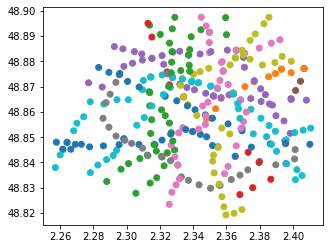

In [27]:
# Ne garder que les arrêts de métro de Paris

Metros = ArretsTC[(ArretsTC["mode"] == 'Metro')]
Metros = gpd.overlay(Metros, IRISPARIS, how='intersection')
Metros.plot(column='res_com')
Metros.head()


In [28]:
# Reprojeter la couche des arrêts de métro 

Metros = Metros.to_crs(2154)
Metros.crs

<Projected CRS: EPSG:2154>
Name: RGF93 / Lambert-93
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: France - onshore and offshore, mainland and Corsica.
- bounds: (-9.86, 41.15, 10.38, 51.56)
Coordinate Operation:
- name: Lambert-93
- method: Lambert Conic Conformal (2SP)
Datum: Reseau Geodesique Francais 1993
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

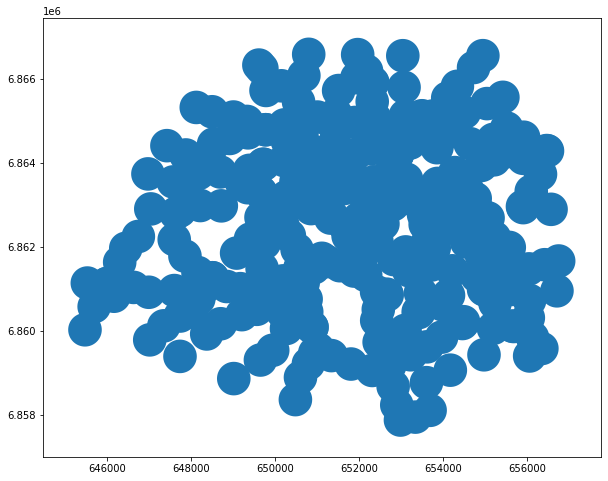

In [29]:
# Buffer de 400m autour des métros

Metrosbuffer = Metros.copy()
Metrosbuffer['geometry'] = Metrosbuffer.geometry.buffer(400)
Metrosbuffer.plot(figsize=(10,10))

In [30]:
# Reprojeter la couche des vélibs

VelibParis2154 = VelibParis.to_crs(2154)
VelibParis2154.crs

<Projected CRS: EPSG:2154>
Name: RGF93 / Lambert-93
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: France - onshore and offshore, mainland and Corsica.
- bounds: (-9.86, 41.15, 10.38, 51.56)
Coordinate Operation:
- name: Lambert-93
- method: Lambert Conic Conformal (2SP)
Datum: Reseau Geodesique Francais 1993
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

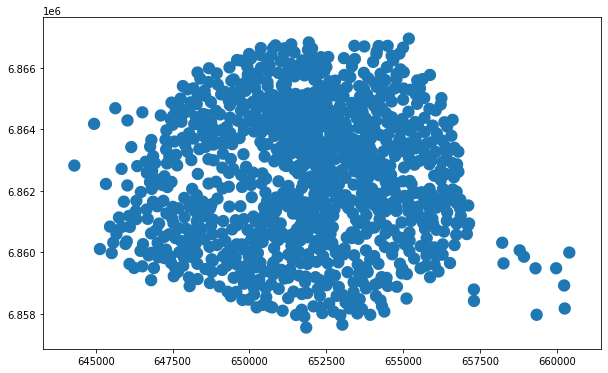

In [31]:
# Buffer de 200m autour des vélibs

Velibsbuffer = VelibParis2154.copy()
Velibsbuffer['geometry'] = Velibsbuffer.geometry.buffer(200)
Velibsbuffer.plot(figsize=(10,10))

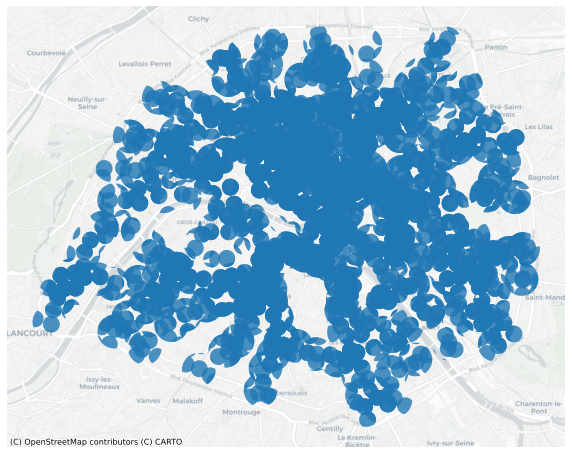

In [32]:
# INTERSECTION des zones à moins de 400m d'une station de métro et à moins de 200m d'une station de vélibs

Intersect = gpd.overlay(Metrosbuffer, Velibsbuffer, how='intersection')

MapIntersect, ax = plt.subplots(figsize=(10,10))
Intersect.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8,)
ctx.add_basemap(ax,  source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.show()

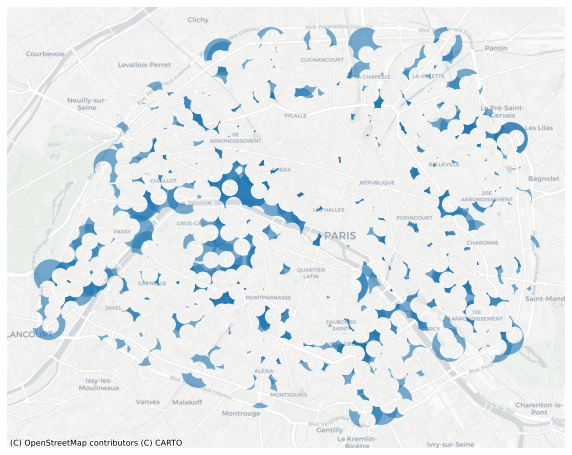

In [33]:
# DIFFERENCE des zones tampons de buffer par les zones tampons des vélibs

Difference = gpd.overlay(Metrosbuffer, Velibsbuffer, how='difference')

MapDifference, ax = plt.subplots(figsize=(10,10))
Difference.to_crs('EPSG:3857').plot(ax=ax, alpha=0.6,)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.show()

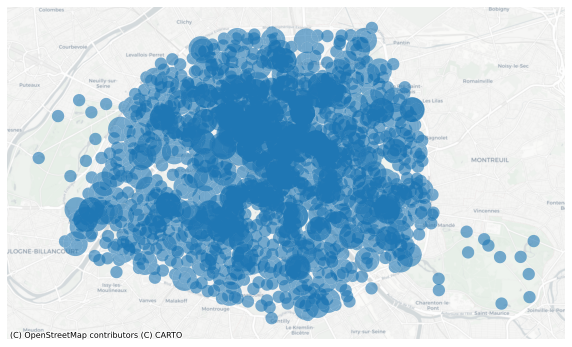

In [34]:
# UNION des zones tampons des métros et des vélibs

Union = gpd.overlay(Metrosbuffer, Velibsbuffer, how='union')

MapUnion, ax = plt.subplots(figsize=(10,10))
Union.to_crs('EPSG:3857').plot(ax=ax, alpha=0.6,)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.show()

## Analyse du plus proche voisin

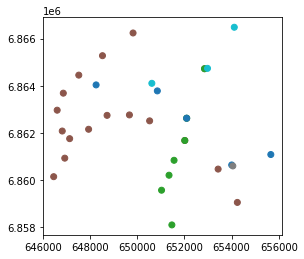

In [35]:
# Ne garder que les arrêts de RER de paris
RER = ArretsTC[(ArretsTC["mode"] == 'RER')]
RER = gpd.overlay(RER, IRISPARIS, how='intersection')

RER = RER.to_crs(2154)

RER.plot(column='res_com')

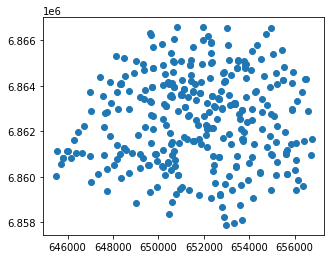

In [36]:
# Affichage des stations de métro 
Metros.plot()

In [37]:
#Calcul des distances

from shapely.geometry import Point, MultiPoint
from shapely.ops import nearest_points

def get_nearest_values(row, other_gdf, point_column='geometry', value_column="geometry"):
    
    # Create an union of the other GeoDataFrame's geometries:
    other_points = other_gdf["geometry"].unary_union
    
    # Find the nearest points
    nearest_geoms = nearest_points(row[point_column], other_points)
    
    # Get corresponding values from the other df
    nearest_data = other_gdf.loc[other_gdf["geometry"] == nearest_geoms[1]]
    
    nearest_value = nearest_data[value_column].values[0]
    
    return nearest_value

In [38]:
#Union des RER

unary_union = RER.unary_union
print(unary_union)

MULTIPOINT (646453.5638999873 6860140.614198474, 646601.5803999834 6862960.595198479, 646816.9783999855 6862076.774998476, 646861.6008999879 6863682.387098482, 646923.387499989 6860926.065398476, 647131.0078999856 6861753.257598476, 647518.2307999891 6864447.503698483, 647934.7661999848 6862151.340598475, 648252.346799986 6864032.792498482, 648523.2279999866 6865272.035398485, 648717.6552999853 6862741.393198477, 649665.8099999891 6862759.702798477, 649819.7896999883 6866235.244698487, 650522.7402999867 6862508.385998477, 650616.8397999872 6864100.093398483, 650849.5186999907 6863778.762598483, 651028.5029999857 6859566.763598472, 651345.3911999858 6860202.455198473, 651465.8890999873 6858094.92669847, 651558.5194999895 6860835.528398476, 652013.6817999877 6861676.037898477, 652093.2250999906 6862619.066798477, 652851.5475999888 6864719.719798484, 652977.6643999841 6864734.770698483, 653427.3991999875 6860462.702198471, 654003.2243999867 6860637.277798476, 654051.0804999871 6860596.113

In [40]:
#Ajouter une colonne avec les coordonnées de la gare RER la plus proche

Metros["nearest_loc"] = Metros.apply(get_nearest_values, other_gdf=RER, axis=1)
Metros.head(2)

,tertrain,cod_ligf,nom_iv,res_stif,cod_resf,tertram,id_ref_zdl,navette,gares_id,principal,reseau,val,res_com,rer,ternavette,picto,ligne_code,fer,terrer,num_psr,nom_gare,termetro,y,ligne,num_mod,idf,terfer,train,tramway,exploitant,metro,terval,indice_lig,id_ref_lda,mode,nomlong,idrefligc,x,idrefliga,iris,nom_iris,typ_iris,dep,insee_com,nom_com,code_iris,geometry,nearest_loc
0,0,7.0,Charles de Gaulle Etoile,110.0,3.0,0,58759.0,0,153,0,METRO,0,METRO 2,0,0,"{'mimetype': 'image/svg+xml', 'format': 'svg',...",2-337,0,0,0,Charles de Gaulle-Étoile,0,6.864074e+06,2,2047,1,0,0,0,RATP,1,0,2,71347,Metro,CHARLES DE GAULLE ETOILE,C01372,648331.6965,A01535,6501,Ternes 1,H,75,75117,Paris 17e Arrondissement,751176501,POINT (648331.696 6864073.835),POINT (648252.346799986 6864032.792498482)
1,0,12.0,Charles de Gaulle Etoile,110.0,3.0,0,58759.0,0,154,0,METRO,0,METRO 6,0,0,"{'mimetype': 'image/svg+xml', 'format': 'svg',...",6-337,0,0,0,Charles de Gaulle-Étoile,M6,6.864089e+06,6,2150,1,0,0,0,RATP,1,0,6,71347,Metro,CHARLES DE GAULLE ETOILE,C01376,648331.3084,A01539,6501,Ternes 1,H,75,75117,Paris 17e Arrondissement,751176501,POINT (648331.308 6864088.819),POINT (648252.346799986 6864032.792498482)


In [41]:
#Ajouter une colonne avec le nom de la gare RER la plus proche

Metros["nearest_stations"] = Metros.apply(get_nearest_values, other_gdf=RER, value_column="nom_iv", axis=1)
Metros.head(2)

,tertrain,cod_ligf,nom_iv,res_stif,cod_resf,tertram,id_ref_zdl,navette,gares_id,principal,reseau,val,res_com,rer,ternavette,picto,ligne_code,fer,terrer,num_psr,nom_gare,termetro,y,ligne,num_mod,idf,terfer,train,tramway,exploitant,metro,terval,indice_lig,id_ref_lda,mode,nomlong,idrefligc,x,idrefliga,iris,nom_iris,typ_iris,dep,insee_com,nom_com,code_iris,geometry,nearest_loc,nearest_stations
0,0,7.0,Charles de Gaulle Etoile,110.0,3.0,0,58759.0,0,153,0,METRO,0,METRO 2,0,0,"{'mimetype': 'image/svg+xml', 'format': 'svg',...",2-337,0,0,0,Charles de Gaulle-Étoile,0,6.864074e+06,2,2047,1,0,0,0,RATP,1,0,2,71347,Metro,CHARLES DE GAULLE ETOILE,C01372,648331.6965,A01535,6501,Ternes 1,H,75,75117,Paris 17e Arrondissement,751176501,POINT (648331.696 6864073.835),POINT (648252.346799986 6864032.792498482),CHARLES DE GAULLE ETOILE
1,0,12.0,Charles de Gaulle Etoile,110.0,3.0,0,58759.0,0,154,0,METRO,0,METRO 6,0,0,"{'mimetype': 'image/svg+xml', 'format': 'svg',...",6-337,0,0,0,Charles de Gaulle-Étoile,M6,6.864089e+06,6,2150,1,0,0,0,RATP,1,0,6,71347,Metro,CHARLES DE GAULLE ETOILE,C01376,648331.3084,A01539,6501,Ternes 1,H,75,75117,Paris 17e Arrondissement,751176501,POINT (648331.308 6864088.819),POINT (648252.346799986 6864032.792498482),CHARLES DE GAULLE ETOILE


In [42]:
# Créer une nouvelle colonne de géométrie à partir des couples de coordonnées

from shapely.geometry import LineString

Metros['line'] = Metros.apply(lambda row: LineString([row['geometry'], row['nearest_loc']]), axis=1)# Create Line Geodataframe
line_gdf = Metros[["nom_iv", "nearest_stations", "line"]].set_geometry('line')# Set the Coordinate reference
line_gdf.crs = crs={"init":"epsg:2154"}
Metros.head(3)

/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


,tertrain,cod_ligf,nom_iv,res_stif,cod_resf,tertram,id_ref_zdl,navette,gares_id,principal,reseau,val,res_com,rer,ternavette,picto,ligne_code,fer,terrer,num_psr,nom_gare,termetro,y,ligne,num_mod,idf,terfer,train,tramway,exploitant,metro,terval,indice_lig,id_ref_lda,mode,nomlong,idrefligc,x,idrefliga,iris,nom_iris,typ_iris,dep,insee_com,nom_com,code_iris,geometry,nearest_loc,nearest_stations,line
0,0,7.0,Charles de Gaulle Etoile,110.0,3.0,0,58759.0,0,153,0,METRO,0,METRO 2,0,0,"{'mimetype': 'image/svg+xml', 'format': 'svg',...",2-337,0,0,0,Charles de Gaulle-Étoile,0,6.864074e+06,2,2047,1,0,0,0,RATP,1,0,2,71347,Metro,CHARLES DE GAULLE ETOILE,C01372,648331.6965,A01535,6501,Ternes 1,H,75,75117,Paris 17e Arrondissement,751176501,POINT (648331.696 6864073.835),POINT (648252.346799986 6864032.792498482),CHARLES DE GAULLE ETOILE,LINESTRING (648331.6964999898 6864073.83459848...
1,0,12.0,Charles de Gaulle Etoile,110.0,3.0,0,58759.0,0,154,0,METRO,0,METRO 6,0,0,"{'mimetype': 'image/svg+xml', 'format': 'svg',...",6-337,0,0,0,Charles de Gaulle-Étoile,M6,6.864089e+06,6,2150,1,0,0,0,RATP,1,0,6,71347,Metro,CHARLES DE GAULLE ETOILE,C01376,648331.3084,A01539,6501,Ternes 1,H,75,75117,Paris 17e Arrondissement,751176501,POINT (648331.308 6864088.819),POINT (648252.346799986 6864032.792498482),CHARLES DE GAULLE ETOILE,LINESTRING (648331.308399984 6864088.819498481...
2,0,1.0,Charles de Gaulle Etoile,110.0,3.0,0,58759.0,0,152,0,METRO,0,METRO 1,0,0,"{'mimetype': 'image/svg+xml', 'format': 'svg',...",1-337,0,0,0,Charles De Gaulle-Étoile,0,6.864133e+06,1,2006,1,0,0,0,RATP,1,0,1,71347,Metro,CHARLES DE GAULLE ETOILE,C01371,648356.9846,A01534,6501,Ternes 1,H,75,75117,Paris 17e Arrondissement,751176501,POINT (648356.985 6864133.201),POINT (648252.346799986 6864032.792498482),CHARLES DE GAULLE ETOILE,LINESTRING (648356.9845999865 6864133.20099848...


,tertrain,cod_ligf,nom_iv,res_stif,cod_resf,tertram,id_ref_zdl,navette,gares_id,principal,reseau,val,res_com,rer,ternavette,picto,ligne_code,fer,terrer,num_psr,nom_gare,termetro,y,ligne,num_mod,idf,terfer,train,tramway,exploitant,metro,terval,indice_lig,id_ref_lda,mode,nomlong,idrefligc,x,idrefliga,iris,nom_iris,typ_iris,dep,insee_com,nom_com,code_iris,geometry,nearest_loc,nearest_stations,line
0,0,7.0,Charles de Gaulle Etoile,110.0,3.0,0,58759.0,0,153,0,METRO,0,METRO 2,0,0,"{'mimetype': 'image/svg+xml', 'format': 'svg',...",2-337,0,0,0,Charles de Gaulle-Étoile,0,6.864074e+06,2,2047,1,0,0,0,RATP,1,0,2,71347,Metro,CHARLES DE GAULLE ETOILE,C01372,648331.6965,A01535,6501,Ternes 1,H,75,75117,Paris 17e Arrondissement,751176501,POINT (648331.696 6864073.835),POINT (648252.346799986 6864032.792498482),CHARLES DE GAULLE ETOILE,"LINESTRING (648331.696 6864073.835, 648252.347..."
1,0,12.0,Charles de Gaulle Etoile,110.0,3.0,0,58759.0,0,154,0,METRO,0,METRO 6,0,0,"{'mimetype': 'image/svg+xml', 'format': 'svg',...",6-337,0,0,0,Charles de Gaulle-Étoile,M6,6.864089e+06,6,2150,1,0,0,0,RATP,1,0,6,71347,Metro,CHARLES DE GAULLE ETOILE,C01376,648331.3084,A01539,6501,Ternes 1,H,75,75117,Paris 17e Arrondissement,751176501,POINT (648331.308 6864088.819),POINT (648252.346799986 6864032.792498482),CHARLES DE GAULLE ETOILE,"LINESTRING (648331.308 6864088.819, 648252.347..."
2,0,1.0,Charles de Gaulle Etoile,110.0,3.0,0,58759.0,0,152,0,METRO,0,METRO 1,0,0,"{'mimetype': 'image/svg+xml', 'format': 'svg',...",1-337,0,0,0,Charles De Gaulle-Étoile,0,6.864133e+06,1,2006,1,0,0,0,RATP,1,0,1,71347,Metro,CHARLES DE GAULLE ETOILE,C01371,648356.9846,A01534,6501,Ternes 1,H,75,75117,Paris 17e Arrondissement,751176501,POINT (648356.985 6864133.201),POINT (648252.346799986 6864032.792498482),CHARLES DE GAULLE ETOILE,"LINESTRING (648356.985 6864133.201, 648252.347..."


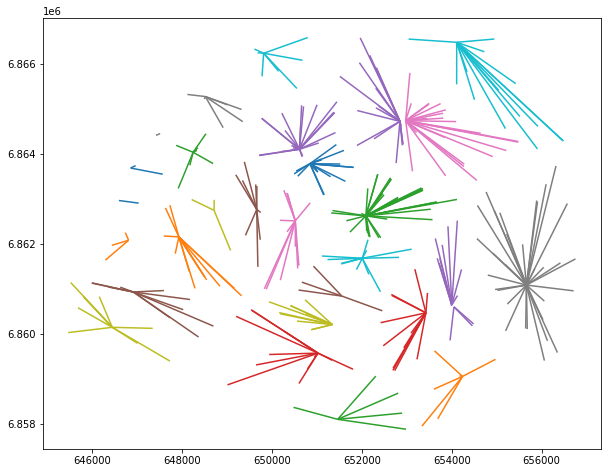

In [71]:
#Générer une nouvelle couche de lignes

LinkMetroRer = Metros.copy()
LinkMetroRer = LinkMetroRer.set_geometry('line')
LinkMetroRer.plot(figsize =(10,10), column = 'nearest_stations')
LinkMetroRer.head(3)

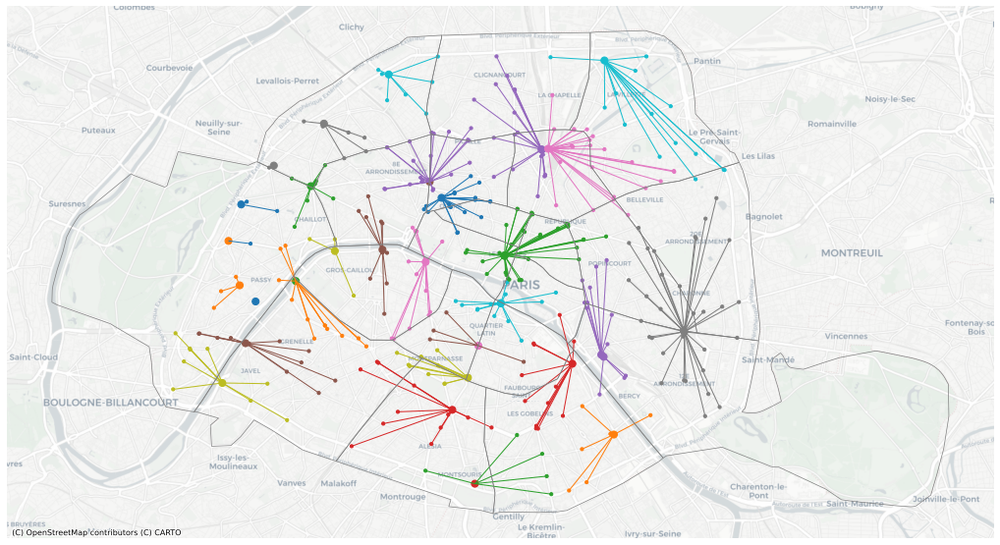

In [74]:
#Faire une carte

Carteflux1, ax = plt.subplots(figsize=(18,16))
RER.to_crs('EPSG:3857').plot(ax=ax, markersize = 50, column = 'nom_iv')
LinkMetroRer.to_crs('EPSG:3857').plot(ax=ax, column = 'nearest_stations', linewidth=1)
Metros.to_crs('EPSG:3857').plot(ax=ax, markersize = 10, column = 'nearest_stations')
ARDT.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.7, color = 'grey')
ctx.add_basemap(ax,  source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.show()

## Exercice sur la proximité des stations de vélibs aux stations de métro

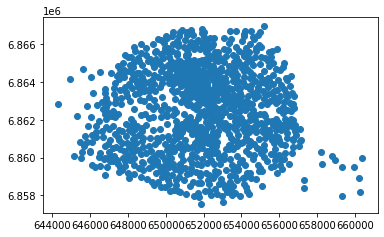

In [45]:
# Affichage des stations de vélibs 
VelibParis2154.plot()

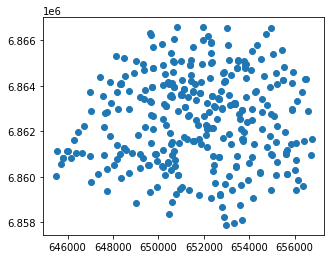

In [ ]:
# Affichage des stations de métro 
Metros.plot()

In [46]:
#Calcul des distances

from shapely.geometry import Point, MultiPoint
from shapely.ops import nearest_points

def get_nearest_values(row, other_gdf, point_column='geometry', value_column="geometry"):
    
    # Create an union of the other GeoDataFrame's geometries:
    other_points = other_gdf["geometry"].unary_union
    
    # Find the nearest points
    nearest_geoms = nearest_points(row[point_column], other_points)
    
    # Get corresponding values from the other df
    nearest_data = other_gdf.loc[other_gdf["geometry"] == nearest_geoms[1]]
    
    nearest_value = nearest_data[value_column].values[0]
    
    return nearest_value

In [47]:
#Union des stations de métros

unary_union = Metros.unary_union
print(unary_union)

MULTIPOINT (645473.5837999886 6860024.259698473, 645529.732599989 6861136.865698475, 645692.4041999882 6860575.692598474, 645811.5378999865 6860831.320498478, 645820.2671999863 6860810.178598473, 645994.7056999883 6861124.074498474, 646004.7810999833 6861128.334898474, 646165.0736999891 6860823.259098474, 646299.9368999831 6861633.692398477, 646364.8035999843 6861037.727698472, 646444.7924999825 6861963.832898476, 646631.0121999838 6861033.151698478, 646744.236799986 6862245.855798475, 646972.7505999889 6863736.12829848, 646993.0905999849 6860917.813198477, 647015.7483999887 6859784.187298473, 647040.6509999866 6862902.376098479, 647351.9233999858 6860118.059498474, 647424.8024999883 6864408.631398483, 647576.359899984 6863545.14779848, 647598.9540999841 6862171.63499848, 647601.6845999893 6860957.977298476, 647636.2012999888 6862795.833598479, 647734.8328999887 6862855.64899848, 647736.014399984 6859390.482998471, 647739.0762999888 6860351.753498473, 647853.8594999847 6861779.46049847

In [49]:
#Ajouter une colonne dans la couche des vélibs avec les coordonnées de la station de métro la plus proche et une autre colonne avec le nom de la station de métro

VelibParis2154["nearest_loc"] = VelibParis2154.apply(get_nearest_values, other_gdf=Metros, axis=1)
VelibParis2154["nearest_stations"] = VelibParis2154.apply(get_nearest_values, other_gdf=Metros, value_column="nom_iv", axis=1)
VelibParis2154.head(2)

,ebike,capacity,name,nom_arrondissement_communes,numbikesavailable,mechanical,stationcode,is_installed,is_renting,numdocksavailable,duedate,is_returning,iris,nom_iris,typ_iris,dep,insee_com,nom_com,code_iris,geometry,nearest_loc,nearest_stations
0,5,35,Benjamin Godard - Victor Hugo,Paris,8,3,16107,OUI,OUI,26,2021-03-04T12:34:56+00:00,OUI,6304,Porte Dauphine 4,H,75,75116,Paris 16e Arrondissement,751166304,POINT (646867.548 6863127.314),POINT (647040.6509999866 6862902.376098479),Rue de la Pompe
1,3,18,Flandrin - Henri Martin,Paris,6,3,16018,OUI,OUI,12,2021-03-04T12:43:11+00:00,OUI,6304,Porte Dauphine 4,H,75,75116,Paris 16e Arrondissement,751166304,POINT (646623.214 6862945.467),POINT (647040.6509999866 6862902.376098479),Rue de la Pompe


In [51]:
# Créer une nouvelle colonne de géométrie à partir des couples de coordonnées

from shapely.geometry import LineString

VelibParis2154['line'] = VelibParis2154.apply(lambda row: LineString([row['geometry'], row['nearest_loc']]), axis=1)# Create Line Geodataframe
line_gdf = VelibParis2154[["stationcode", "nearest_stations", "line"]].set_geometry('line')# Set the Coordinate reference
line_gdf.crs = crs={"init":"epsg:2154"}
VelibParis2154.head(3)

/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


,ebike,capacity,name,nom_arrondissement_communes,numbikesavailable,mechanical,stationcode,is_installed,is_renting,numdocksavailable,duedate,is_returning,iris,nom_iris,typ_iris,dep,insee_com,nom_com,code_iris,geometry,nearest_loc,nearest_stations,line
0,5,35,Benjamin Godard - Victor Hugo,Paris,8,3,16107,OUI,OUI,26,2021-03-04T12:34:56+00:00,OUI,6304,Porte Dauphine 4,H,75,75116,Paris 16e Arrondissement,751166304,POINT (646867.548 6863127.314),POINT (647040.6509999866 6862902.376098479),Rue de la Pompe,LINESTRING (646867.5475999101 6863127.31356447...
1,3,18,Flandrin - Henri Martin,Paris,6,3,16018,OUI,OUI,12,2021-03-04T12:43:11+00:00,OUI,6304,Porte Dauphine 4,H,75,75116,Paris 16e Arrondissement,751166304,POINT (646623.214 6862945.467),POINT (647040.6509999866 6862902.376098479),Rue de la Pompe,LINESTRING (646623.214381445 6862945.467321204...
2,1,20,Charonne - Robert et Sonia Delauney,Paris,2,1,11104,OUI,OUI,18,2021-03-04T12:44:23+00:00,OUI,4411,Sainte-Marguerite 11,H,75,75111,Paris 11e Arrondissement,751114411,POINT (655430.484 6861934.722),POINT (655576.9893999876 6861985.837598477),Alexandre Dumas,LINESTRING (655430.4842862445 6861934.72171558...


,ebike,capacity,name,nom_arrondissement_communes,numbikesavailable,mechanical,stationcode,is_installed,is_renting,numdocksavailable,duedate,is_returning,iris,nom_iris,typ_iris,dep,insee_com,nom_com,code_iris,geometry,nearest_loc,nearest_stations,line
0,5,35,Benjamin Godard - Victor Hugo,Paris,8,3,16107,OUI,OUI,26,2021-03-04T12:34:56+00:00,OUI,6304,Porte Dauphine 4,H,75,75116,Paris 16e Arrondissement,751166304,POINT (646867.548 6863127.314),POINT (647040.6509999866 6862902.376098479),Rue de la Pompe,"LINESTRING (646867.548 6863127.314, 647040.651..."
1,3,18,Flandrin - Henri Martin,Paris,6,3,16018,OUI,OUI,12,2021-03-04T12:43:11+00:00,OUI,6304,Porte Dauphine 4,H,75,75116,Paris 16e Arrondissement,751166304,POINT (646623.214 6862945.467),POINT (647040.6509999866 6862902.376098479),Rue de la Pompe,"LINESTRING (646623.214 6862945.467, 647040.651..."
2,1,20,Charonne - Robert et Sonia Delauney,Paris,2,1,11104,OUI,OUI,18,2021-03-04T12:44:23+00:00,OUI,4411,Sainte-Marguerite 11,H,75,75111,Paris 11e Arrondissement,751114411,POINT (655430.484 6861934.722),POINT (655576.9893999876 6861985.837598477),Alexandre Dumas,"LINESTRING (655430.484 6861934.722, 655576.989..."


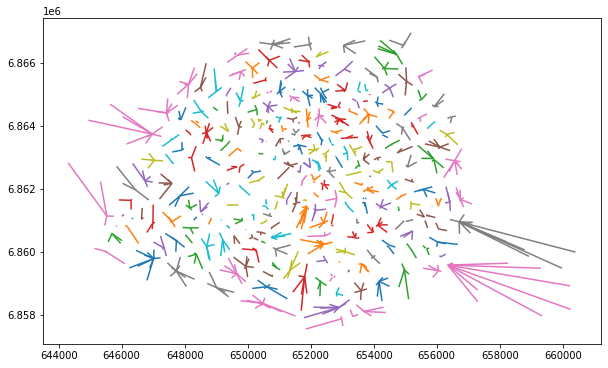

In [52]:
#Générer une nouvelle couche de lignes

LinkVelibsMetro = VelibParis2154.copy()
LinkVelibsMetro = LinkVelibsMetro.set_geometry('line')
LinkVelibsMetro.plot(figsize =(10,10), column = 'nearest_stations')
LinkVelibsMetro.head(3)

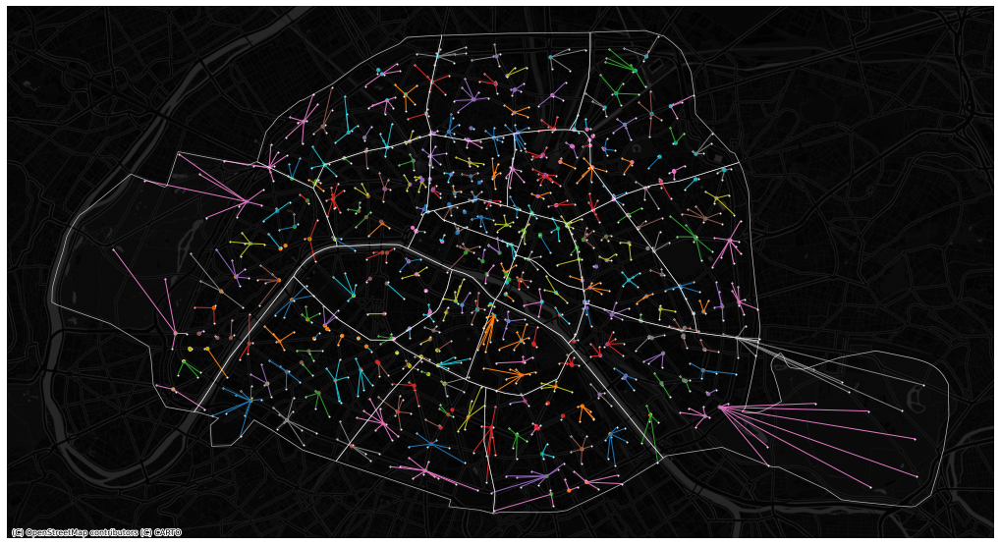

In [70]:
#Faire une carte

Carteflux2, ax = plt.subplots(figsize=(18,16))
Metros.to_crs('EPSG:3857').plot(ax=ax, markersize = 10, column = 'nearest_stations')
LinkVelibsMetro.to_crs('EPSG:3857').plot(ax=ax, column = 'nearest_stations', linewidth=1)
VelibParis2154.to_crs('EPSG:3857').plot(ax=ax, markersize = 1, color = 'white')
ARDT.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.7, color = 'white', alpha=0.7)
ax.axis("off")
ctx.add_basemap(ax, source=ctx.providers.CartoDB.DarkMatterNoLabels)
plt.show()

## Carroyage

### Méthode 1 > Carroyage "manuel"

####Nombre de places de vélibs 

(2.2298421041179997, 2.471534953582, 48.8119800955, 48.905228081100006)

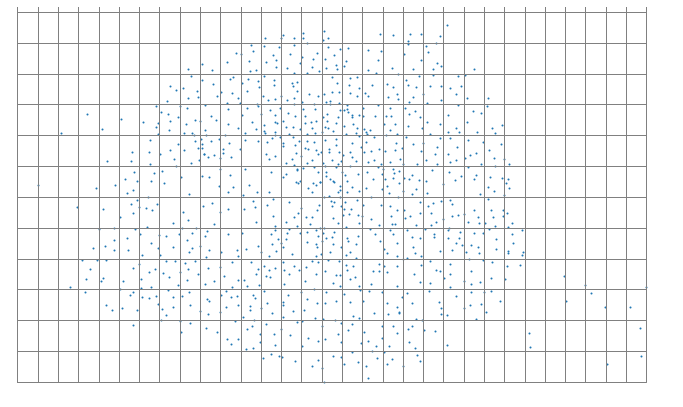

In [106]:
# Définir l'emprise de la grille
xmin, ymin, xmax, ymax= VelibParis.total_bounds

# Paramètrer le nombre de cellule
n_cells=30
cell_size = (xmax-xmin)/n_cells

# Création des cellules
grid_cells = []
for x0 in np.arange(xmin, xmax+cell_size, cell_size ):
    for y0 in np.arange(ymin, ymax+cell_size, cell_size):
        # bounds
        x1 = x0-cell_size
        y1 = y0+cell_size
        grid_cells.append(shapely.geometry.box(x0, y0, x1, y1)  )
cell = gpd.GeoDataFrame(grid_cells, columns=['geometry'], 
                                 crs='EPSG:4326')


# Cartographie pour contrôle
ax = VelibParis.plot(markersize=1, figsize=(12, 8))
plt.autoscale(False)
cell.plot(ax=ax, facecolor="none", edgecolor='grey')
ax.axis("off")



In [107]:
#Jointure spatiale Velibs<>Grille

merged = gpd.sjoin(VelibParis, cell, how='left', op='within')
merged.head(3)

,ebike,capacity,name,nom_arrondissement_communes,numbikesavailable,mechanical,stationcode,is_installed,is_renting,numdocksavailable,duedate,is_returning,iris,nom_iris,typ_iris,dep,insee_com,nom_com,code_iris,geometry,index_right
0,5,35,Benjamin Godard - Victor Hugo,Paris,8,3,16107,OUI,OUI,26,2021-03-04T12:34:56+00:00,OUI,6304,Porte Dauphine 4,H,75,75116,Paris 16e Arrondissement,751166304,POINT (2.27572 48.86598),71.0
1,3,18,Flandrin - Henri Martin,Paris,6,3,16018,OUI,OUI,12,2021-03-04T12:43:11+00:00,OUI,6304,Porte Dauphine 4,H,75,75116,Paris 16e Arrondissement,751166304,POINT (2.27242 48.86433),71.0
2,1,20,Charonne - Robert et Sonia Delauney,Paris,2,1,11104,OUI,OUI,18,2021-03-04T12:44:23+00:00,OUI,4411,Sainte-Marguerite 11,H,75,75111,Paris 11e Arrondissement,751114411,POINT (2.39257 48.85591),278.0


In [108]:
# Agrégation statistique
dissolve = merged.dissolve(by="index_right", aggfunc="sum")
dissolve.head(3)

,geometry,ebike,capacity,numbikesavailable,mechanical,numdocksavailable,iris,dep,insee_com,code_iris
index_right,,,,,,,,,,
29.0,POINT (2.25252 48.83866),3,32,5,2,26,6131,75,75116,751166131
31.0,POINT (2.25491 48.85772),9,30,15,6,14,6177,75,75116,751166177
34.0,POINT (2.24942 48.87526),9,66,26,17,40,6277,75,75116,751166277


In [109]:
# Enrichissement du carroyage
cell.loc[dissolve.index, 'capacity']=dissolve.capacity.values
del dissolve
cell.head()

,geometry,capacity
0,"POLYGON ((2.23350 48.81622, 2.23350 48.82354, ...",NaN
1,"POLYGON ((2.23350 48.82354, 2.23350 48.83087, ...",NaN
2,"POLYGON ((2.23350 48.83087, 2.23350 48.83819, ...",NaN
3,"POLYGON ((2.23350 48.83819, 2.23350 48.84551, ...",NaN
4,"POLYGON ((2.23350 48.84551, 2.23350 48.85284, ...",NaN


In [110]:
#Verification somme

total1 = VelibParis['capacity'].sum()
total2 = cell['capacity'].sum()

print(total1)
print(total2)

32189
32139.0


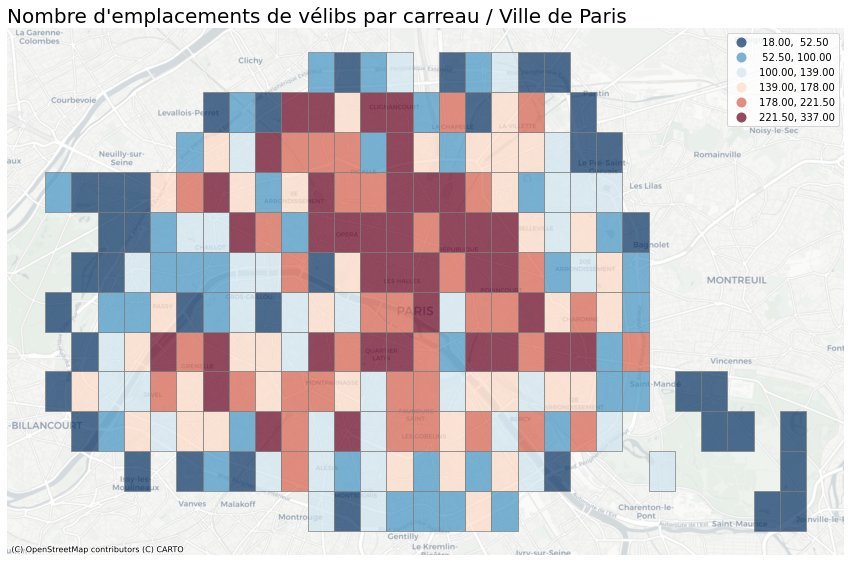

In [111]:
#Cartographie du carroyage

CarroyageVelib, ax = plt.subplots(figsize=(15,15))
cell.to_crs('EPSG:3857').plot(ax=ax, column='capacity', figsize=(12, 8), k=6, cmap='RdBu_r', scheme='quantiles', edgecolor="grey", alpha=0.7, legend = 'true')
ax.axis("off")
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
plt.title("Nombre d'emplacements de vélibs par carreau / Ville de Paris", loc='left', fontsize=20)
plt.show()

####Nombre d'arbres

,geometry
0,"POLYGON ((2.22363 48.81574, 2.22363 48.81816, ..."
1,"POLYGON ((2.22363 48.81816, 2.22363 48.82057, ..."
2,"POLYGON ((2.22363 48.82057, 2.22363 48.82299, ..."
3,"POLYGON ((2.22363 48.82299, 2.22363 48.82540, ..."
4,"POLYGON ((2.22363 48.82540, 2.22363 48.82782, ..."
...,...
3732,"POLYGON ((2.46516 48.89303, 2.46516 48.89545, ..."
3733,"POLYGON ((2.46516 48.89545, 2.46516 48.89786, ..."
3734,"POLYGON ((2.46516 48.89786, 2.46516 48.90028, ..."
3735,"POLYGON ((2.46516 48.90028, 2.46516 48.90269, ..."


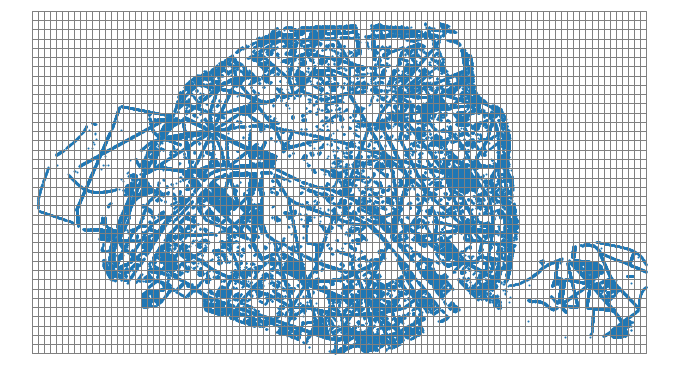

In [116]:
# Définir l'emprise de la grille
xmin, ymin, xmax, ymax= ArbresParis.total_bounds

# Paramètrer le nombre de cellule
n_cells=100
cell_size = (xmax-xmin)/n_cells

# Création des cellules
grid_cells = []
for x0 in np.arange(xmin, xmax+cell_size, cell_size ):
    for y0 in np.arange(ymin, ymax+cell_size, cell_size):
        # bounds
        x1 = x0-cell_size
        y1 = y0+cell_size
        grid_cells.append(shapely.geometry.box(x0, y0, x1, y1)  )
cell = gpd.GeoDataFrame(grid_cells, columns=['geometry'], 
                                 crs='EPSG:4326')


# Cartographie pour contrôle
ax = ArbresParis.plot(markersize=1, figsize=(12, 8))
plt.autoscale(False)
cell.plot(ax=ax, facecolor="none", edgecolor='grey')
ax.axis("off")
cell


In [91]:
#Jointure spatiale Arbres<>Carroyage

merged2 = gpd.sjoin(ArbresParis, cell, how='left', op='within')
merged2.head(2)

,idbase,domanialite,arrondissement,libellefrancais,hauteurenm,geo_point_2d,Latitude,Longitude,iris,nom_iris,typ_iris,dep,insee_com,nom_com,code_iris,geometry,index_right
0,2029277,DJS,PARIS 19E ARRDT,Copalme,5,"48.8910678703,2.39818911237",48.8910678703,2.39818911237,7401,Pont de Flandre 1,H,75,75119,Paris 19e Arrondissement,751197401,POINT (2.39819 48.89107),2695.0
1,195778,PERIPHERIQUE,PARIS 19E ARRDT,Pin,8,"48.9001235785,2.38322501988",48.9001235785,2.38322501988,7401,Pont de Flandre 1,H,75,75119,Paris 19e Arrondissement,751197401,POINT (2.38323 48.90012),2476.0


In [92]:
# make a simple count variable that we can sum
merged2['idbase']=1
merged2.head(2)

,idbase,domanialite,arrondissement,libellefrancais,hauteurenm,geo_point_2d,Latitude,Longitude,iris,nom_iris,typ_iris,dep,insee_com,nom_com,code_iris,geometry,index_right
0,1,DJS,PARIS 19E ARRDT,Copalme,5,"48.8910678703,2.39818911237",48.8910678703,2.39818911237,7401,Pont de Flandre 1,H,75,75119,Paris 19e Arrondissement,751197401,POINT (2.39819 48.89107),2695.0
1,1,PERIPHERIQUE,PARIS 19E ARRDT,Pin,8,"48.9001235785,2.38322501988",48.9001235785,2.38322501988,7401,Pont de Flandre 1,H,75,75119,Paris 19e Arrondissement,751197401,POINT (2.38323 48.90012),2476.0


In [93]:
# Compute stats per grid cell -- aggregate fires to grid cells with dissolve
dissolve = merged2.dissolve(by="index_right", aggfunc="sum")
# put this into cell
cell.loc[dissolve.index, 'idbase']=dissolve.idbase.values
del dissolve

cell.head()

,geometry,idbase
0,"POLYGON ((2.22363 48.81574, 2.22363 48.81816, ...",NaN
1,"POLYGON ((2.22363 48.81816, 2.22363 48.82057, ...",NaN
2,"POLYGON ((2.22363 48.82057, 2.22363 48.82299, ...",NaN
3,"POLYGON ((2.22363 48.82299, 2.22363 48.82540, ...",NaN
4,"POLYGON ((2.22363 48.82540, 2.22363 48.82782, ...",NaN


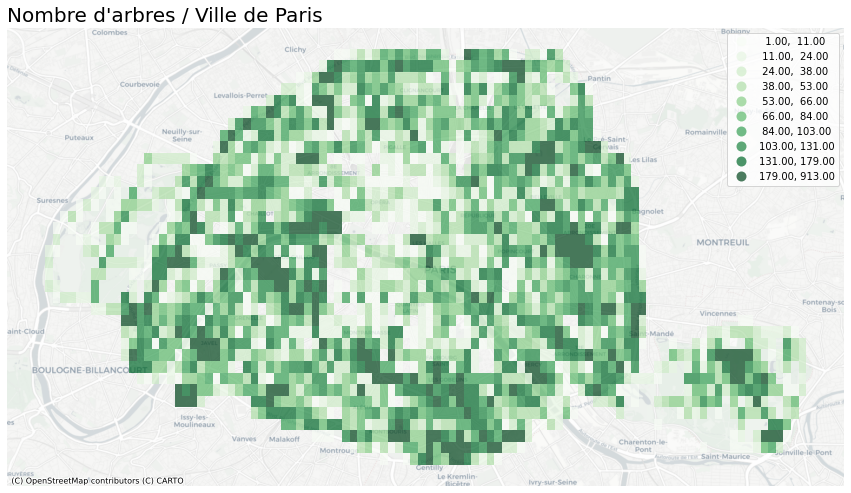

In [102]:
# Cartographie

CarroyageArbres, ax = plt.subplots(figsize=(15,15))
cell.to_crs('EPSG:3857').plot(ax=ax, column='idbase', figsize=(12, 8), k=10, cmap='Greens', scheme='quantiles', edgecolor="none", alpha=0.7, legend = 'true')
ax.axis("off")
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
plt.title("Nombre d'arbres / Ville de Paris", loc='left', fontsize=20)
plt.show()

### Méthode 2 > H3 Uber Index

* https://eng.uber.com/h3/
* https://uber.github.io/h3/#/documentation/core-library/resolution-table

In [ ]:
# Install H3Index (UBER)
!pip install h3
from h3 import h3

In [98]:
#Création du référentiel H3

h3_level = 10
 
def lat_lng_to_h3(row):
    return h3.geo_to_h3(
      row.geometry.y, row.geometry.x, h3_level)
 
ArbresParis['h3'] = ArbresParis.apply(lat_lng_to_h3, axis=1)

In [99]:
#Connaitre le nombre de mailles

counts = ArbresParis.groupby(['h3']).h3.agg('count').to_frame('count').reset_index()
counts["h3"].size

5657

In [112]:
#Comptage du nombre d'arbres par maille

from shapely.geometry import Polygon
def add_geometry(row):
    points = h3.h3_to_geo_boundary(
      row['h3'], True)
    return Polygon(points)
 
counts['geometry'] = counts.apply(add_geometry, axis=1)
H3 = gpd.GeoDataFrame(counts, crs='EPSG:4326')
H3.head()

,h3,count,geometry
0,8a1fb460d827fff,65,"POLYGON ((2.27124 48.82880, 2.27034 48.82864, ..."
1,8a1fb460d82ffff,8,"POLYGON ((2.27286 48.82848, 2.27196 48.82832, ..."
2,8a1fb460d837fff,2,"POLYGON ((2.27015 48.82799, 2.26925 48.82783, ..."
3,8a1fb460d907fff,95,"POLYGON ((2.26910 48.83024, 2.26820 48.83007, ..."
4,8a1fb460d90ffff,122,"POLYGON ((2.27072 48.82992, 2.26982 48.82976, ..."


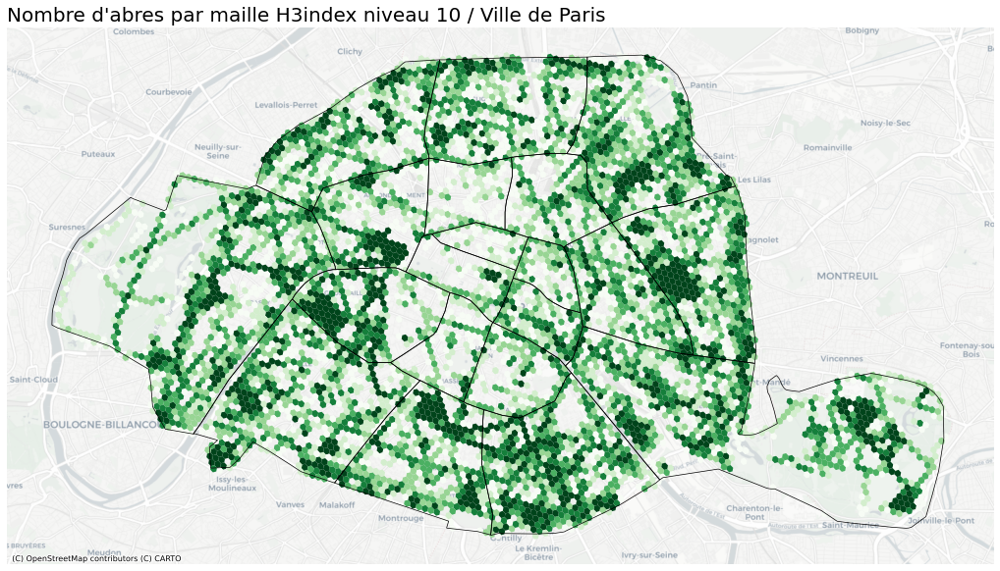

In [114]:
#Cartographie 

H3Map, ax = plt.subplots(figsize=(18,16))
H3.to_crs('EPSG:3857').plot(ax=ax, column='count', figsize=(12, 8),k=6, cmap='Greens', scheme='quantiles')
ARDT.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.7, color = 'black')
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
plt.title("Nombre d'abres par maille H3index niveau 10 / Ville de Paris", loc='left', fontsize=20)
ax.axis("off")
plt.show()